# Part 0: Set up

## Part 0.1: Library Importing 

In [64]:
#utility functions 
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import tqdm
import pickle
import random 

warnings.filterwarnings("ignore")

In [65]:
#data preprocessing 
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import LeaveOneGroupOut
#metrics
from sklearn.metrics import make_scorer

In [66]:
#models 
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor

In [67]:
#cross-validation
from sklearn.model_selection import cross_val_score

In [68]:
#hyper parameter tuning
import time
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

In [69]:
#Setting the random seed 
seed = 42
np.random.seed(seed) 
random.seed(seed)

## Part 0.2: Data Importing 

In [70]:
cost = pd.read_csv("cost.csv")
cost.head()

,Task ID,Supplier ID,Cost
0,30/05/2019,S1,0.478219
1,30/05/2019,S2,0.444543
2,30/05/2019,S3,0.521679
3,30/05/2019,S4,0.307331
4,30/05/2019,S5,0.357689


In [71]:
cost.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7680 entries, 0 to 7679
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Task ID      7680 non-null   object 
 1   Supplier ID  7680 non-null   object 
 2   Cost         7680 non-null   float64
dtypes: float64(1), object(2)
memory usage: 180.1+ KB


In [72]:
print(len(cost["Task ID"].unique()), len(cost["Supplier ID"].unique()))

120 64


In [73]:
cost.isna().sum()

Task ID        0
Supplier ID    0
Cost           0
dtype: int64

In [74]:
suppliers = pd.read_csv("suppliers.csv") 
suppliers.head()

,Supplier ID,SF1,SF2,SF3,SF4,SF5,SF6,SF7,SF8,SF9,SF10,SF11,SF12,SF13,SF14,SF15,SF16,SF17,SF18
0,S1,100,1000,1000,50,20,10,2,80,2000,100,1000,5,1000,1000,500,5000,100,96
1,S2,100,1000,1000,50,20,10,0,80,2000,100,1000,5,1000,1000,500,5000,100,96
2,S3,100,1000,1000,50,20,10,2,80,2000,100,1000,5,1000,1000,500,5000,0,96
3,S4,100,1000,1000,50,20,10,2,80,2000,100,1000,5,1000,1000,500,5000,5000,96
4,S5,10,1000,100,500,200,10,2,80,200,100,2000,8,2000,100,2000,5000,15000,90


In [75]:
suppliers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64 entries, 0 to 63
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Supplier ID  64 non-null     object
 1   SF1          64 non-null     int64 
 2   SF2          64 non-null     int64 
 3   SF3          64 non-null     int64 
 4   SF4          64 non-null     int64 
 5   SF5          64 non-null     int64 
 6   SF6          64 non-null     int64 
 7   SF7          64 non-null     int64 
 8   SF8          64 non-null     int64 
 9   SF9          64 non-null     int64 
 10  SF10         64 non-null     int64 
 11  SF11         64 non-null     int64 
 12  SF12         64 non-null     int64 
 13  SF13         64 non-null     int64 
 14  SF14         64 non-null     int64 
 15  SF15         64 non-null     int64 
 16  SF16         64 non-null     int64 
 17  SF17         64 non-null     int64 
 18  SF18         64 non-null     int64 
dtypes: int64(18), object(1)
memory 

In [76]:
suppliers.isna().any().sum()

0

In [77]:
tasks= pd.read_excel("tasks.xlsx") 
tasks.head()

,Task ID,TF1,TF2,TF3,TF4,TF5,TF6,TF7,TF8,TF9,...,TF107,TF108,TF109,TF110,TF111,TF112,TF113,TF114,TF115,TF116
0,2019 05 30,706,2539,428536374,367,0.144545,35342375,0.08,829,0.326506,...,125,0,219407.09,903728.98,10174793,0,801,0.315479,26873722,0.06
1,2019 09 26,697,2199,389831692,431,0.195998,20091114,0.05,460,0.209186,...,149,0,467568.10,1868010.80,19221510,0,723,0.328786,20359365,0.05
2,2019 11 29,262,4156,500027098,1510,0.363330,89708355,0.18,1010,0.243022,...,394,0,228358.20,1358750.92,38657530,0,837,0.201396,28562699,0.06
3,2020 01 03,469,4346,547810586,1376,0.316613,90478530,0.17,1097,0.252416,...,394,0,258487.96,1781016.69,39064840,0,706,0.162448,19579305,0.04
4,2020 01 07,555,3934,521676289,1039,0.264108,69762831,0.13,943,0.239705,...,394,0,285558.89,1869912.30,39064840,0,757,0.192425,24164620,0.05


In [78]:
tasks.columns

Index(['Task ID', 'TF1', 'TF2', 'TF3', 'TF4', 'TF5', 'TF6', 'TF7', 'TF8',
       'TF9',
       ...
       'TF107', 'TF108', 'TF109', 'TF110', 'TF111', 'TF112', 'TF113', 'TF114',
       'TF115', 'TF116'],
      dtype='object', length=117)

In [79]:
tasks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130 entries, 0 to 129
Columns: 117 entries, Task ID to TF116
dtypes: float64(58), int64(58), object(1)
memory usage: 119.0+ KB


In [80]:
tasks.isna().any().sum()

0

In [81]:
#checking merging conditions on task id 
cost["Task ID"]

0       30/05/2019
1       30/05/2019
2       30/05/2019
3       30/05/2019
4       30/05/2019
           ...    
7675    22/12/2021
7676    22/12/2021
7677    22/12/2021
7678    22/12/2021
7679    22/12/2021
Name: Task ID, Length: 7680, dtype: object

In [82]:
#checking merging conditions on task id 
tasks.index

RangeIndex(start=0, stop=130, step=1)

In [83]:
#reformatting the task id from cost to meet task 
cost["Task ID"] = [x[-4:] + " " + x[3:5] + " " + x[0:2] for x in cost["Task ID"].to_list()]
cost["Task ID"]

0       2019 05 30
1       2019 05 30
2       2019 05 30
3       2019 05 30
4       2019 05 30
           ...    
7675    2021 12 22
7676    2021 12 22
7677    2021 12 22
7678    2021 12 22
7679    2021 12 22
Name: Task ID, Length: 7680, dtype: object

# Part 1: Data Preparation

## Part 1.1: Finding Missing Values

In [84]:
#1.1-finding missing values
print("1. There are",cost.isna().any().sum(),"missing values in cost")
print("2. There are",suppliers.isna().any().sum(),"missing values in suppliers")
print("3. There are",tasks.isna().any().sum(),"missing values in tasks")

#1.1-count the number of tasks, suppliers, features and cost values in all data sets
print("4. There are",tasks.shape[0],"tasks")
print("5. There are",suppliers.shape[0],"suppliers")
print("6. There are",suppliers.shape[1]-1,"features in suppliers")
print("7. There are",tasks.shape[1]-1,"features in tasks")
print("8. There are",len(cost['Cost'].unique()),"costs")

1. There are 0 missing values in cost
2. There are 0 missing values in suppliers
3. There are 0 missing values in tasks
4. There are 130 tasks
5. There are 64 suppliers
6. There are 18 features in suppliers
7. There are 116 features in tasks
8. There are 7680 costs


In [85]:
print(len(cost['Cost'])-len(cost['Cost'].unique()))

0


In [86]:
print(pd.Series([len(x) for x in tasks['Task ID']]).value_counts())

10    129
11      1
dtype: int64


In [87]:
tasks.loc[pd.Series([len(x) for x in tasks['Task ID']]) == 11]

,Task ID,TF1,TF2,TF3,TF4,TF5,TF6,TF7,TF8,TF9,...,TF107,TF108,TF109,TF110,TF111,TF112,TF113,TF114,TF115,TF116
104,2021 11 05,1,1127,71490927,724,0.642413,46889265,0.66,223,0.19787,...,0,0,0.0,0.0,0,0,75,0.066548,2538489,0.04


In [88]:
#idenitying the unique tasks id in cost and tasks
tasks=tasks.replace("2021 11 05 ","2021 11 05") #bc there is a space in task file, but no space in cost file
tasks.loc[tasks["Task ID"] == "2021 11 05"]
cost_task_id = cost["Task ID"].unique()
tasks_task_id = tasks["Task ID"].unique()
print(f"there are {len(cost_task_id)} unique Task ID in cost")
print(f"there are {len(tasks_task_id)} unique Task ID in task")

there are 120 unique Task ID in cost
there are 130 unique Task ID in task


In [89]:
#identifying and removing the ids that need to be removed
to_drop_list = []

for cur_id in tasks_task_id:
    if cur_id not in cost_task_id:
        to_drop_list.append(cur_id)
    else:
        continue 

print("These",len(to_drop_list),"Task IDs need to be removed")
print(to_drop_list)
#originally removed 11 tasks but now 10 tasks-->
#refer to the previous cell regarding the spacing issue of Task ID "2021 11 05 " in task file

These 10 Task IDs need to be removed
['2020 01 28', '2020 03 09', '2020 10 09', '2020 10 13', '2020 10 16', '2020 10 19', '2020 10 21', '2021 03 31', '2021 08 13', '2021 09 16']


In [90]:
#removing these IDs from the the tasks dataframe
#set the index 
tasks.index = tasks["Task ID"]
#removing the lsit through the matching index
tasks = tasks.drop(to_drop_list)
#reindex
tasks = tasks.reset_index(drop=True)
print("\ntasks after deleting 10 Task IDs:\n")
tasks


tasks after deleting 10 Task IDs:



,Task ID,TF1,TF2,TF3,TF4,TF5,TF6,TF7,TF8,TF9,...,TF107,TF108,TF109,TF110,TF111,TF112,TF113,TF114,TF115,TF116
0,2019 05 30,706,2539,428536374,367,0.144545,35342375,0.08,829,0.326506,...,125,0,219407.09,903728.98,10174793,0,801,0.315479,26873722,0.06
1,2019 09 26,697,2199,389831692,431,0.195998,20091114,0.05,460,0.209186,...,149,0,467568.10,1868010.80,19221510,0,723,0.328786,20359365,0.05
2,2019 11 29,262,4156,500027098,1510,0.363330,89708355,0.18,1010,0.243022,...,394,0,228358.20,1358750.92,38657530,0,837,0.201396,28562699,0.06
3,2020 01 03,469,4346,547810586,1376,0.316613,90478530,0.17,1097,0.252416,...,394,0,258487.96,1781016.69,39064840,0,706,0.162448,19579305,0.04
4,2020 01 07,555,3934,521676289,1039,0.264108,69762831,0.13,943,0.239705,...,394,0,285558.89,1869912.30,39064840,0,757,0.192425,24164620,0.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,2021 12 15,1,3200,490935166,1013,0.316563,54130582,0.11,1213,0.379063,...,204,0,2370854.38,8364205.81,66646372,0,185,0.057813,8004697,0.02
116,2021 12 16,1,3655,506899785,1422,0.389056,69650824,0.14,1336,0.365527,...,259,0,2225977.15,8046625.74,68781077,0,174,0.047606,8210251,0.02
117,2021 12 17,1,3721,523237621,1427,0.383499,72353297,0.14,1345,0.361462,...,263,0,2331590.62,8339577.56,68777865,0,141,0.037893,6644987,0.01
118,2021 12 21,1,3501,535604319,1316,0.375893,72548424,0.14,1314,0.375321,...,254,0,2407486.67,8753349.75,69920452,0,281,0.080263,14601484,0.03


In [91]:
tasks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120 entries, 0 to 119
Columns: 117 entries, Task ID to TF116
dtypes: float64(58), int64(58), object(1)
memory usage: 109.8+ KB


## Part 1.2: Calculating Five Number Summary 

In [92]:
#retrieving five number summary for variables from supplier
suppliers_sum = suppliers.drop(columns = ["Supplier ID"]).agg(["max","min","mean","var"]).transpose()
suppliers_sum.head()

,max,min,mean,var
SF1,1000.0,10.0,353.1250,194625.000000
SF2,2000.0,100.0,1031.2500,573611.111111
SF3,2000.0,100.0,1031.2500,573611.111111
SF4,500.0,5.0,176.5625,48656.250000
SF5,200.0,2.0,70.6250,7785.000000


In [93]:
#retrieving the five number summary for variables from tasks
tasks_sum = tasks.drop(columns = ["Task ID"]).agg(["max","min","mean","var"]).transpose()
tasks_sum.head()

,max,min,mean,var
TF1,7.060000e+02,0.000000e+00,8.310000e+01,3.610110e+04
TF2,7.908000e+03,1.127000e+03,4.436525e+03,2.295513e+06
TF3,7.699058e+08,7.149093e+07,5.045244e+08,1.254908e+16
TF4,3.344000e+03,3.670000e+02,1.516933e+03,4.692247e+05
TF5,6.424135e-01,1.444709e-01,3.364570e-01,6.265964e-03


In [94]:
#merging both dataframes together 
summary_df = pd.concat([suppliers_sum, tasks_sum])
summary_df.insert(0, "factor", summary_df.index)
summary_df = summary_df.reset_index(drop = True)
summary_df

,factor,max,min,mean,var
0,SF1,1.000000e+03,1.000000e+01,3.531250e+02,1.946250e+05
1,SF2,2.000000e+03,1.000000e+02,1.031250e+03,5.736111e+05
2,SF3,2.000000e+03,1.000000e+02,1.031250e+03,5.736111e+05
3,SF4,5.000000e+02,5.000000e+00,1.765625e+02,4.865625e+04
4,SF5,2.000000e+02,2.000000e+00,7.062500e+01,7.785000e+03
...,...,...,...,...,...
129,TF112,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
130,TF113,1.211000e+03,3.000000e+01,3.828083e+02,8.194009e+04
131,TF114,3.287858e-01,1.156069e-02,8.788045e-02,3.961211e-03
132,TF115,5.880575e+07,1.031294e+06,1.680272e+07,1.390096e+14


In [95]:
#identifying variables that need to be removed
to_drop_var_task = summary_df[summary_df["var"] < 0.01]["factor"].to_list()
print("The following",len(to_drop_var_task),"TFs(task features) need to be removed as it's variance is <0.01")
print(to_drop_var_task)

The following 33 TFs(task features) need to be removed as it's variance is <0.01
['TF5', 'TF7', 'TF9', 'TF11', 'TF13', 'TF15', 'TF31', 'TF35', 'TF38', 'TF39', 'TF42', 'TF46', 'TF47', 'TF50', 'TF51', 'TF53', 'TF57', 'TF61', 'TF63', 'TF64', 'TF66', 'TF75', 'TF79', 'TF84', 'TF88', 'TF92', 'TF96', 'TF100', 'TF104', 'TF108', 'TF112', 'TF114', 'TF116']


In [96]:
#removing the variables from tasks following above 
#tasks=tasks.drop(['TF31', 'TF75', 'TF79', 'TF84', 'TF88', 'TF92', 'TF96', 'TF100', 'TF104', 'TF108', 'TF112'],axis=1)
tasks=tasks.drop(to_drop_var_task,axis=1)
#tasks=tasks[~tasks["Task ID"].isin(to_drop_var_task)]
print("\ntasks after deleting the TF(task feature) with variance <0.01:\n")
print(tasks)


tasks after deleting the TF(task feature) with variance <0.01:

        Task ID  TF1   TF2        TF3   TF4       TF6   TF8       TF10  TF12  \
0    2019 05 30  706  2539  428536374   367  35342375   829  109388318   452   
1    2019 09 26  697  2199  389831692   431  20091114   460   72475671   287   
2    2019 11 29  262  4156  500027098  1510  89708355  1010  112404944   812   
3    2020 01 03  469  4346  547810586  1376  90478530  1097  122674168   834   
4    2020 01 07  555  3934  521676289  1039  69762831   943  112768389   682   
..          ...  ...   ...        ...   ...       ...   ...        ...   ...   
115  2021 12 15    1  3200  490935166  1013  54130582  1213  113855258   641   
116  2021 12 16    1  3655  506899785  1422  69650824  1336  118556296   758   
117  2021 12 17    1  3721  523237621  1427  72353297  1345  121170804   765   
118  2021 12 21    1  3501  535604319  1316  72548424  1314  121685335   725   
119  2021 12 22    1  3683  545374101  1508  83750259  

## Part 1.3: Scale all features to \[-1,1\]

### Tasks

In [97]:
#select features without Task ID in the dataframe to allow to be scaled 
new_tasks=tasks.iloc[:,1:].values
new_tasks

array([[7.06000000e+02, 2.53900000e+03, 4.28536374e+08, ...,
        1.01747930e+07, 8.01000000e+02, 2.68737220e+07],
       [6.97000000e+02, 2.19900000e+03, 3.89831692e+08, ...,
        1.92215100e+07, 7.23000000e+02, 2.03593650e+07],
       [2.62000000e+02, 4.15600000e+03, 5.00027098e+08, ...,
        3.86575300e+07, 8.37000000e+02, 2.85626990e+07],
       ...,
       [1.00000000e+00, 3.72100000e+03, 5.23237621e+08, ...,
        6.87778650e+07, 1.41000000e+02, 6.64498700e+06],
       [1.00000000e+00, 3.50100000e+03, 5.35604319e+08, ...,
        6.99204520e+07, 2.81000000e+02, 1.46014840e+07],
       [1.00000000e+00, 3.68300000e+03, 5.45374101e+08, ...,
        6.77358220e+07, 2.35000000e+02, 1.20609580e+07]])

In [98]:
#values after min max scaling
scaler=preprocessing.MinMaxScaler(feature_range=(-1,1))
scaled_tasks=scaler.fit_transform(new_tasks)
scaled_tasks

#save the scaled data to tasks
tasks_temp=pd.DataFrame(scaled_tasks)
tasks_temp.columns=tasks.columns[1:]
tasks_temp.insert(0,"Task ID" ,tasks["Task ID"])
tasks=tasks_temp
tasks.describe()

,TF1,TF2,TF3,TF4,TF6,TF8,TF10,TF12,TF14,TF16,...,TF102,TF103,TF105,TF106,TF107,TF109,TF110,TF111,TF113,TF115
count,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,...,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000
mean,-0.764589,-0.023883,0.240046,-0.227455,-0.149144,0.013395,0.182222,-0.089343,0.109792,-0.364654,...,-0.419737,-0.390243,-0.897621,-0.818910,-0.576099,-0.326552,0.124035,0.312298,-0.402526,-0.454035
std,0.538252,0.446865,0.320791,0.460195,0.463138,0.460289,0.403770,0.549027,0.496322,0.441139,...,0.312007,0.282225,0.190125,0.210168,0.315733,0.457378,0.564741,0.398266,0.484762,0.408147
min,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,-0.997167,-0.389692,0.065294,-0.576251,-0.526141,-0.341063,-0.107543,-0.494310,-0.333640,-0.625801,...,-0.595851,-0.534086,-0.954660,-0.897104,-0.749598,-0.712033,-0.391449,0.091375,-0.763760,-0.761936
50%,-0.997167,-0.109866,0.243418,-0.315082,-0.234172,-0.117515,0.089202,-0.280939,0.004166,-0.429102,...,-0.445725,-0.422452,-0.933586,-0.855688,-0.672830,-0.421480,0.117030,0.418994,-0.584251,-0.572207
75%,-0.991501,0.389913,0.424761,0.121263,0.183564,0.220846,0.500947,0.384424,0.593293,-0.284322,...,-0.241113,-0.308111,-0.895472,-0.825187,-0.563505,0.133441,0.723313,0.576245,-0.183743,-0.266199
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Suppliers 

In [99]:
#select features without Supplier ID in the dataframe to allow to be scaled 
new_suppliers=suppliers.iloc[:,1:].values
new_suppliers

array([[  100,  1000,  1000, ...,  5000,   100,    96],
       [  100,  1000,  1000, ...,  5000,   100,    96],
       [  100,  1000,  1000, ...,  5000,     0,    96],
       ...,
       [ 1000,  1000,  2000, ...,  5000, 15000,    90],
       [  100,  1000,  1000, ...,  5000,  7500,    90],
       [  100,  2000,  1000, ...,   500, 50000,    98]])

In [100]:
#values after min max scaling
scaler=preprocessing.MinMaxScaler(feature_range=(-1,1))
scaled_suppliers=scaler.fit_transform(new_suppliers)
scaled_suppliers=pd.DataFrame(scaled_suppliers)

#save the scaled data to suppliers
suppliers_temp=pd.DataFrame(scaled_suppliers)
suppliers_temp.columns=suppliers.columns[1:]
suppliers_temp.insert(0,"Supplier ID" ,suppliers["Supplier ID"])
suppliers=suppliers_temp
suppliers.describe()

,SF1,SF2,SF3,SF4,SF5,SF6,SF7,SF8,SF9,SF10,SF11,SF12,SF13,SF14,SF15,SF16,SF17,SF18
count,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000
mean,-0.306818,-0.019737,-0.019737,-0.306818,-0.306818,-0.306818,0.312500,-0.265244,-0.019737,-0.237245,-0.019737,0.053571,-0.019737,-0.019737,-0.201923,0.075000,-0.307687,0.187500
std,0.891239,0.797233,0.797233,0.891239,0.891239,0.891239,0.556745,0.868354,0.797233,0.854528,0.797233,0.799862,0.797233,0.797233,0.839020,0.802773,0.757387,0.833333
min,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.333333,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.960000,-1.000000
50%,-0.818182,-0.052632,-0.052632,-0.818182,-0.818182,-0.818182,0.333333,-0.707317,-0.052632,-0.632653,-0.052632,0.142857,-0.052632,-0.052632,-0.538462,0.200000,-0.700000,0.500000
75%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,-0.400000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Part 1.4: Computing Absolute Correlations

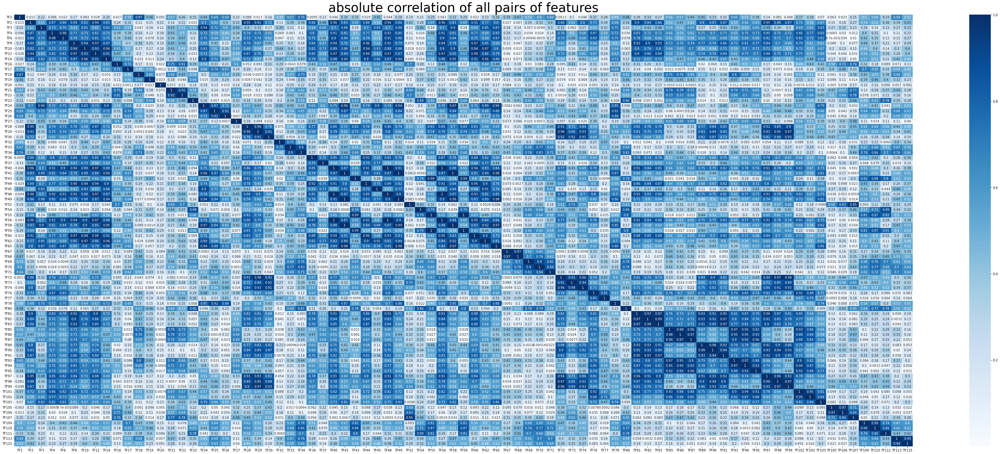

In [101]:
#1.4-caclucating absolute correlation and visualising it
corr_df = tasks.corr().abs()
import seaborn as sn
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = [50, 20]
plt.rcParams["figure.autolayout"] = True
sn.heatmap(corr_df,annot=True, cmap = 'Blues')
plt.title('absolute correlation of all pairs of features', fontsize=40)
plt.show()

In [102]:
#initialisation 
task_var = list(tasks.columns[1:].copy())  
#copy tasks' all columns(first row) and convert them into a list-->a list that has all the TFs
threshold = 0.8 
dropped_var = [] #create a list that contain the TFs that needed to be dropped

#retrieving the current dataframe
cur_df = tasks[task_var] 
#put tasks' TFs(from task_var list, which has all the TFs) list into "cur_df" 

#unstacking the correlation matrix 
corr_df = tasks[task_var].corr().abs() 
#make tasks.csv's TFs into a absolute correlation and renamed to "corr_df"

#retrieving correlation pairs 
corr_pairs = tasks[task_var].corr().unstack().reset_index() 
#.unstack() makes the correlation dataframe into another form (var_1 var_2a correlation, var_1 var_2b correlation....) 
#.reset_index() makes the new form into a dataframe that puts var_1 into a column named level_0, 
#and var_2 into a column named level_1 and correlation into a column named 0
corr_pairs.columns = ["variable_1", "variable_2", "correlation"] 
#rename the columns of previous line of code, so the column names are changed from 
#level_0, level_1, 0 into variable_1, variable_2, correlation
corr_pairs["abs_correlation"] = abs(corr_pairs["correlation"]) 
#create a new column called abs_correlation by attach a ['abs_correlation'] 
#the rows of value under this column are the dataframe's "correlation" column's absolute correlations (by using abs())

#droppping the perfectly correlated pairs 
corr_pairs = corr_pairs.loc[~(corr_pairs["variable_1"] == corr_pairs["variable_2"]),:] 
#drop the rows that variables are compared with themselves, e.g. TF1 and TF1 (this kind of rows always have correlation of "1")

#sorting 
corr_pairs = corr_pairs.sort_values(by = ["abs_correlation"], ascending = False).reset_index(drop = True) 
#sort the dataframe in an descending order so that we get the TFs that have highest absolute correlations at top

#retrieving the pairs > threshold 
corr_pairs_filtered = corr_pairs[corr_pairs["abs_correlation"]>=threshold] 
#create a new dataframe called "corr_pairs_filtered" and put TFs that have abs correlation>0.8 into this new dataframe

while len(corr_pairs_filtered) != 0: #execute this while-loop until len(corr_pairs_filtered)=0
    var_1 = list(corr_pairs_filtered["variable_1"])[0] 
    #the highest TF of variable_1 in "corr_pairs_filtered" which shows on the top of the dataframe in row 0
    var_2 = list(corr_pairs_filtered["variable_2"])[0] 
    #the highest TF of variable_2 in "corr_pairs_filtered" which shows on the top of the dataframe in row 0
    
    exclusion_list = [var_1, var_2] #put the highest TFs of var_1 and var_2 into "exclustion_list"
    exclusion_list.extend(dropped_var) #put values in "dropped_var" into "exclustion_list"
    
    corr_1 = corr_df[var_1].sort_values(ascending = False) #sort the corr_df's variable_1 in descending order
    corr_1 = corr_1[~corr_1.index.isin(exclusion_list)] #check whether these TFs are in "exclusiton_list"
    
    corr_2 = corr_df[var_2].sort_values(ascending = False) 
    corr_2 = corr_2[~corr_2.index.isin(exclusion_list)]
    corr_1[3]
    corr_2[3] 
    
    for val_1, val_2 in zip(corr_1, corr_2): 
        #zip(corr_1,crr_2) put the values in the same index of corr_1 and corr_2 together as a pair

        #print("{0:.16f}".format(float(val_1)))
        #print("{0:.16f}".format(float(val_2)))
        val_1=("{0:.16f}".format(float(val_1)))
        val_2=("{0:.16f}".format(float(val_2)))
        if val_1> val_2: #in the pairs, if val_1 > val_2, 
            drop_var = var_1 #put var_1 into "drop_var" -->drop the most correlated ones
            print(f"remove: {drop_var} {val_1} \n keep: {var_2} {val_2}")
            corr_df = corr_df.drop(drop_var,axis=1)
            corr_df = corr_df.drop(drop_var,axis=0)
            break

        elif val_1< val_2: #in the pairs, if val_1 < val_2,
            drop_var = var_2 #put var_2 into "drop_var" -->drop the most correlated ones
            print(f"remove: {drop_var} {val_2} \n keep: {var_1} {val_1}")
            corr_df = corr_df.drop(drop_var,axis=1)
            corr_df = corr_df.drop(drop_var,axis=0)
            break
        else:
            continue  #if val_1, val_2 not matching the above, skip them and continue to look the next val_1 and val_2 

    #adding the dropped variable 
    dropped_var.append(drop_var) #put all the TFs "drop_var" that are most correlated into "dropped_var"
    
    #updating the corr_pairs_filtered by removing the variable 1 and variable 2 both present case 
    corr_pairs_filtered = corr_pairs_filtered[~(corr_pairs_filtered.variable_1.isin([var_1, var_2]) & 
                                                corr_pairs_filtered.variable_2.isin([var_1, var_2]))] 

    #updating the corr_pairs_filtered by removing the dropped variable present case 
    corr_pairs_filtered = corr_pairs_filtered[~(corr_pairs_filtered.variable_1.isin([drop_var]) | corr_pairs_filtered.variable_2.isin([drop_var]))] 
    #update the corr_pairs_filtered which exclude those TFs where the TFs of variable_1 in "corr_pairs_filtered is in [drop_var] 
    #OR the TFs of variable_2 in "corr_pairs_filtered is in [drop_var]
#print out the final absolute correlation
corr_df

remove: TF55 0.8110425793977414 
 keep: TF59 0.8110425793977413
remove: TF40 0.9988909994467344 
 keep: TF56 0.9981219776209505
remove: TF56 0.9740016663889063 
 keep: TF48 0.9653900264073014
remove: TF41 0.9953025812914736 
 keep: TF58 0.9924076400761431
remove: TF49 0.9840572681250679 
 keep: TF58 0.9729247808545908
remove: TF82 0.9747984278920591 
 keep: TF83 0.9667481755438203
remove: TF43 0.8770427843202940 
 keep: TF59 0.8672675064696489
remove: TF72 0.9799466045628048 
 keep: TF29 0.9719395352304223
remove: TF4 0.9180700006753050 
 keep: TF6 0.9086694408083391
remove: TF86 0.9691237599528224 
 keep: TF85 0.9688982731368679
remove: TF90 0.9406735452337999 
 keep: TF89 0.9344146593479390
remove: TF60 0.9732019325936954 
 keep: TF12 0.9693342402176274
remove: TF99 0.9719395352304223 
 keep: TF98 0.9597886515513453
remove: TF58 0.9661670438860596 
 keep: TF65 0.9405954853615561
remove: TF12 0.9653900264073014 
 keep: TF8 0.9593624229781221
remove: TF93 0.9679071752970413 
 keep: TF8

,TF1,TF16,TF17,TF19,TF20,TF21,TF23,TF26,TF27,TF30,...,TF67,TF71,TF77,TF85,TF91,TF103,TF105,TF109,TF111,TF115
TF1,1.000000,0.026701,0.581815,0.457002,0.091222,0.571555,0.311291,0.687994,0.218495,0.160667,...,0.393300,0.657219,0.283688,0.556645,0.246577,0.069748,0.062578,0.498035,0.333381,0.515531
TF16,0.026701,1.000000,0.706378,0.110229,0.021818,0.752752,0.386715,0.210347,0.603755,0.306270,...,0.197333,0.283720,0.146004,0.527297,0.145469,0.411100,0.581203,0.324710,0.088787,0.131921
TF17,0.581815,0.706378,1.000000,0.558227,0.001247,0.189790,0.097582,0.671171,0.239337,0.123947,...,0.089019,0.618307,0.069346,0.012447,0.032026,0.386686,0.397409,0.701700,0.326654,0.488463
TF19,0.457002,0.110229,0.558227,1.000000,0.022549,0.177078,0.643094,0.285049,0.163465,0.180099,...,0.145639,0.326959,0.194508,0.463916,0.280525,0.118049,0.095621,0.394290,0.396972,0.230999
TF20,0.091222,0.021818,0.001247,0.022549,1.000000,0.072461,0.137557,0.031764,0.141066,0.105393,...,0.084237,0.160731,0.194277,0.005863,0.155421,0.133155,0.005043,0.147826,0.096037,0.091372
TF21,0.571555,0.752752,0.189790,0.177078,0.072461,1.000000,0.583790,0.166671,0.583157,0.127176,...,0.449134,0.262786,0.417180,0.793223,0.215041,0.355243,0.432331,0.121457,0.374561,0.276527
TF23,0.311291,0.386715,0.097582,0.643094,0.137557,0.583790,1.000000,0.014791,0.323382,0.186964,...,0.356366,0.327693,0.356257,0.592567,0.012166,0.337925,0.222009,0.486245,0.778398,0.277553
TF26,0.687994,0.210347,0.671171,0.285049,0.031764,0.166671,0.014791,1.000000,0.000723,0.277626,...,0.128223,0.506039,0.405672,0.060549,0.095967,0.545322,0.044953,0.516011,0.201777,0.523231
TF27,0.218495,0.603755,0.239337,0.163465,0.141066,0.583157,0.323382,0.000723,1.000000,0.021974,...,0.072584,0.222427,0.197508,0.645628,0.415372,0.389922,0.319791,0.113527,0.107261,0.040102
TF30,0.160667,0.306270,0.123947,0.180099,0.105393,0.127176,0.186964,0.277626,0.021974,1.000000,...,0.074974,0.046937,0.495915,0.288238,0.726659,0.451998,0.425756,0.261120,0.337094,0.189022


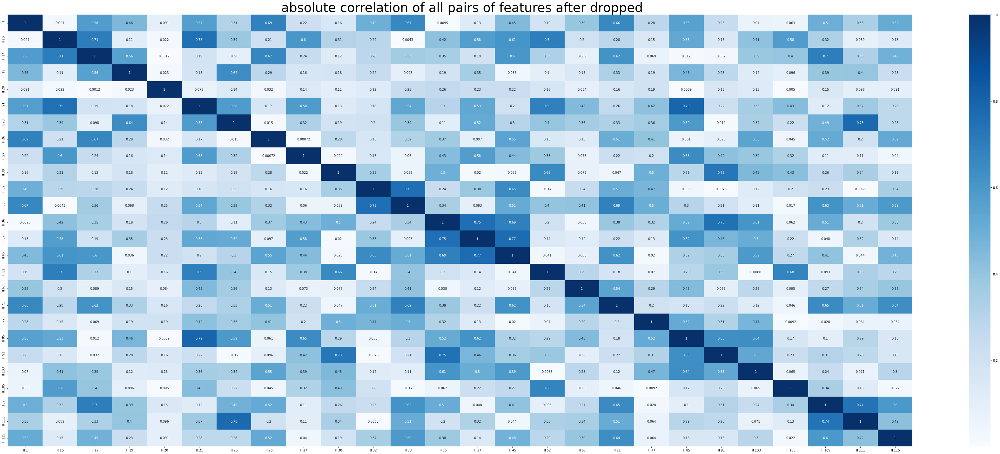

In [103]:
plt.rcParams['figure.figsize'] = [50,20]
plt.rcParams['figure.autolayout'] =True
plt.title(' absolute correlation of all pairs of features after dropped', fontsize=40)
sn.heatmap(corr_df,annot=True, cmap = 'Blues')
plt.show()


## Part 1.5: Top 20 Suppliers for each task

In [104]:
#retrieving the unique suppliers list 
supplier_list = cost["Supplier ID"].unique()

#creating an empty supplier list 
supplier_top_20_list = []

#creating a group by object 
groupby_ID = cost.groupby("Task ID")

#for loop to loop through each of the task ID's
for name, group in groupby_ID:
    #sort by ascending cost and retrieve the lowest 20 supplier ID's
    cur_top_20 = list(group.sort_values(by = ['Cost'], ascending = True)["Supplier ID"][:20].values)
    
    #save these to the supplier list 
    supplier_top_20_list.extend(cur_top_20)

#creating a frequency table of number of times in top 20 
print("The top 10 that has appeared the most in the top 20 lists")
print(pd.Series(supplier_top_20_list).value_counts().head(10))

print("\nThe lowest 10 that has appeared the least in the top 20 lists")
print(pd.Series(supplier_top_20_list).value_counts().tail(10))
    
#retrieving the unique set for the supllier that has been in the top 20 
unique_supplier = list(set(supplier_top_20_list))
print(f"\nthere has been {len(unique_supplier)} suppliers that has been a part of the top 20")

#retrieving the non-overlapping elements 
print(f"\nthe following suppliers have not been a part in the top 20 list")
to_drop_suppliers = list(set(supplier_list) -set(unique_supplier))
print(to_drop_suppliers)

#remove from the data that all suppliers that never appear in the top 20 of any task
cost.index = cost["Supplier ID"]
print(f"there are {len(cost['Supplier ID'].unique())} suppliers before drop in cost.csv")
cost = cost.drop(to_drop_suppliers)
cost = cost.reset_index(drop=True)
print(f"there are {len(cost['Supplier ID'].unique())} rows before drop in cost.csv")

suppliers.index = suppliers['Supplier ID']
print(f"there are {len(suppliers['Supplier ID'].unique())} suppliers before drop in suppliers.csv")
suppliers = suppliers.drop(to_drop_suppliers) 
suppliers = suppliers.reset_index(drop=True)
print(f"there are {len(suppliers['Supplier ID'].unique())} suppliers after drop in suppliers.csv")

The top 10 that has appeared the most in the top 20 lists
S56    91
S33    89
S34    87
S15    82
S11    70
S27    70
S51    66
S57    63
S46    58
S64    57
dtype: int64

The lowest 10 that has appeared the least in the top 20 lists
S58    14
S63    12
S21    12
S38    11
S1     11
S26    11
S43     9
S31     9
S44     7
S3      1
dtype: int64

there has been 63 suppliers that has been a part of the top 20

the following suppliers have not been a part in the top 20 list
['S2']
there are 64 suppliers before drop in cost.csv
there are 63 rows before drop in cost.csv
there are 64 suppliers before drop in suppliers.csv
there are 63 suppliers after drop in suppliers.csv


## Part 1.6: Finalizing the suppliers and tasks dataframe

In [105]:
#save the prepared supplier dataframe under this name 
cleaned_suppliers = suppliers
cleaned_suppliers.head()

,Supplier ID,SF1,SF2,SF3,SF4,SF5,SF6,SF7,SF8,SF9,SF10,SF11,SF12,SF13,SF14,SF15,SF16,SF17,SF18
0,S1,-0.818182,-0.052632,-0.052632,-0.818182,-0.818182,-0.818182,0.333333,-0.707317,-0.052632,-0.632653,-0.052632,0.142857,-0.052632,-0.052632,-0.538462,0.2,-0.996,0.5
1,S3,-0.818182,-0.052632,-0.052632,-0.818182,-0.818182,-0.818182,0.333333,-0.707317,-0.052632,-0.632653,-0.052632,0.142857,-0.052632,-0.052632,-0.538462,0.2,-1.000,0.5
2,S4,-0.818182,-0.052632,-0.052632,-0.818182,-0.818182,-0.818182,0.333333,-0.707317,-0.052632,-0.632653,-0.052632,0.142857,-0.052632,-0.052632,-0.538462,0.2,-0.800,0.5
3,S5,-1.000000,-0.052632,-1.000000,1.000000,1.000000,-0.818182,0.333333,-0.707317,-1.000000,-0.632653,1.000000,1.000000,1.000000,-1.000000,1.000000,0.2,-0.400,-1.0
4,S6,-1.000000,-1.000000,1.000000,-1.000000,1.000000,1.000000,-0.333333,-1.000000,1.000000,-1.000000,1.000000,-1.000000,-1.000000,1.000000,-0.538462,0.2,-0.700,-1.0


In [106]:
cleaned_suppliers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63 entries, 0 to 62
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Supplier ID  63 non-null     object 
 1   SF1          63 non-null     float64
 2   SF2          63 non-null     float64
 3   SF3          63 non-null     float64
 4   SF4          63 non-null     float64
 5   SF5          63 non-null     float64
 6   SF6          63 non-null     float64
 7   SF7          63 non-null     float64
 8   SF8          63 non-null     float64
 9   SF9          63 non-null     float64
 10  SF10         63 non-null     float64
 11  SF11         63 non-null     float64
 12  SF12         63 non-null     float64
 13  SF13         63 non-null     float64
 14  SF14         63 non-null     float64
 15  SF15         63 non-null     float64
 16  SF16         63 non-null     float64
 17  SF17         63 non-null     float64
 18  SF18         63 non-null     float64
dtypes: float64

In [107]:
tasks.index = tasks['Task ID']
cleaned_tasks = tasks.copy()
cleaned_tasks = tasks_temp[corr_df.columns.values]
cleaned_tasks = cleaned_tasks.reset_index()

In [108]:
#save the prepared tasks dataframe under this name 
cleaned_tasks.head()

,Task ID,TF1,TF16,TF17,TF19,TF20,TF21,TF23,TF26,TF27,...,TF67,TF71,TF77,TF85,TF91,TF103,TF105,TF109,TF111,TF115
0,2019 05 30,1.000000,-0.559193,-0.350672,1.000000,0.961792,-0.379070,0.421053,0.547957,-0.599289,...,-0.999425,-0.472868,-0.784169,-0.770894,-0.684107,-0.401560,-0.925939,-0.881587,-0.708961,-0.105403
1,2019 09 26,0.974504,0.017794,-0.560807,0.662732,0.961792,-1.000000,0.333333,0.444928,-0.599289,...,-1.000000,-0.658915,-0.773527,-0.923091,-0.622902,-0.553691,-0.890053,-0.747656,-0.450189,-0.330913
2,2019 11 29,-0.257790,-0.424278,-0.642854,0.662732,-0.951252,-0.001434,0.578947,0.557054,-0.599289,...,-0.999307,-0.798450,-0.653773,-0.700180,-0.630800,-0.434418,-0.939066,-0.876756,0.105757,-0.046935
3,2020 01 03,0.328612,-0.435824,-0.627916,0.662732,0.886693,-0.017407,0.561404,0.839891,-0.599289,...,-0.999354,-0.875969,-0.710788,-0.712838,-0.630800,-0.456214,-0.936777,-0.860495,0.117408,-0.357917
4,2020 01 07,0.572238,-0.353895,-0.624852,0.662732,0.886693,-0.147246,0.491228,0.842061,-0.599289,...,-0.999533,-0.891473,-0.706875,-0.788918,-0.630800,-0.460648,-0.930154,-0.845885,0.117408,-0.199185


In [109]:
cleaned_tasks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120 entries, 0 to 119
Data columns (total 27 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Task ID  120 non-null    object 
 1   TF1      120 non-null    float64
 2   TF16     120 non-null    float64
 3   TF17     120 non-null    float64
 4   TF19     120 non-null    float64
 5   TF20     120 non-null    float64
 6   TF21     120 non-null    float64
 7   TF23     120 non-null    float64
 8   TF26     120 non-null    float64
 9   TF27     120 non-null    float64
 10  TF30     120 non-null    float64
 11  TF32     120 non-null    float64
 12  TF33     120 non-null    float64
 13  TF36     120 non-null    float64
 14  TF37     120 non-null    float64
 15  TF45     120 non-null    float64
 16  TF52     120 non-null    float64
 17  TF67     120 non-null    float64
 18  TF71     120 non-null    float64
 19  TF77     120 non-null    float64
 20  TF85     120 non-null    float64
 21  TF91     120 non

In [110]:
#save the prepared cost dataframe under this name 
cleaned_cost = cost
cleaned_cost.head()

,Task ID,Supplier ID,Cost
0,2019 05 30,S1,0.478219
1,2019 05 30,S3,0.521679
2,2019 05 30,S4,0.307331
3,2019 05 30,S5,0.357689
4,2019 05 30,S6,0.351982


In [111]:
cleaned_cost.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7560 entries, 0 to 7559
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Task ID      7560 non-null   object 
 1   Supplier ID  7560 non-null   object 
 2   Cost         7560 non-null   float64
dtypes: float64(1), object(2)
memory usage: 177.3+ KB


# Part 2: Exploratory Data Anlaysis (EDA)

## Part 2.1: Distribution of feature values for each task

In [112]:
#create the copy for tasks dataset
eda_tasks = cleaned_tasks.copy()
#change the index of the copy dataset
eda_tasks.index = eda_tasks['Task ID']
#drop specified labels from columns
eda_tasks.drop('Task ID',axis=1,inplace=True)
#transpose the copy dataset
eda_tasks = eda_tasks.transpose()
eda_tasks

Task ID,2019 05 30,2019 09 26,2019 11 29,2020 01 03,2020 01 07,2020 01 08,2020 01 09,2020 01 10,2020 01 14,2020 01 15,...,2021 12 02,2021 12 03,2021 12 09,2021 12 10,2021 12 14,2021 12 15,2021 12 16,2021 12 17,2021 12 21,2021 12 22
TF1,1.000000,0.974504,-0.257790,0.328612,0.572238,0.538244,0.640227,0.203966,0.368272,0.147309,...,-0.997167,-0.997167,-0.997167,-0.997167,-0.997167,-0.997167,-0.997167,-0.997167,-0.997167,-0.997167
TF16,-0.559193,0.017794,-0.424278,-0.435824,-0.353895,-0.359984,-0.384579,-0.430921,-0.441914,-0.515144,...,-0.461922,-0.410518,-0.373428,-0.395018,-0.567023,-0.433847,-0.372875,-0.363068,-0.380783,-0.507552
TF17,-0.350672,-0.560807,-0.642854,-0.627916,-0.624852,-0.619719,-0.625541,-0.621021,-0.622630,-0.602789,...,0.399471,0.318114,0.390125,0.343701,0.314667,0.458689,0.445513,0.439078,0.494542,0.379247
TF19,1.000000,0.662732,0.662732,0.662732,0.662732,0.662732,0.662732,0.662732,0.662732,0.662732,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
TF20,0.961792,0.961792,-0.951252,0.886693,0.886693,0.886693,0.886693,0.886693,0.886693,0.886693,...,0.886693,0.886693,0.886693,0.886693,0.886693,-0.951252,-0.951252,-0.951252,-0.951252,-0.951252
TF21,-0.379070,-1.000000,-0.001434,-0.017407,-0.147246,-0.142740,-0.118984,-0.063690,-0.081712,0.009216,...,0.643252,0.641204,0.591235,0.604342,0.687897,0.638747,0.653082,0.642433,0.660455,0.701413
TF23,0.421053,0.333333,0.578947,0.561404,0.491228,0.526316,0.508772,0.578947,0.614035,0.578947,...,0.947368,0.947368,0.894737,0.859649,0.894737,0.894737,0.912281,0.929825,0.912281,0.947368
TF26,0.547957,0.444928,0.557054,0.839891,0.842061,0.842933,0.842933,0.842933,0.849518,0.853154,...,-0.761538,-0.646849,-0.750773,-0.726801,-0.708202,-0.751655,-0.590019,-0.535657,-0.525439,-0.541969
TF27,-0.599289,-0.599289,-0.599289,-0.599289,-0.599289,-0.599289,-0.599289,-0.599289,-0.599289,-0.599289,...,-0.497113,-0.497113,-0.411680,-0.411680,-0.411680,-0.411680,-0.411680,-0.414927,0.547029,-0.198464
TF30,-0.762431,-0.760589,-0.488029,-0.760589,-0.760589,-0.760589,-0.760589,-0.760589,-0.760589,-0.760589,...,-1.000000,-0.775322,-0.963168,-0.895028,-0.988950,-0.994475,-0.755064,-0.745856,-0.734807,-0.762431


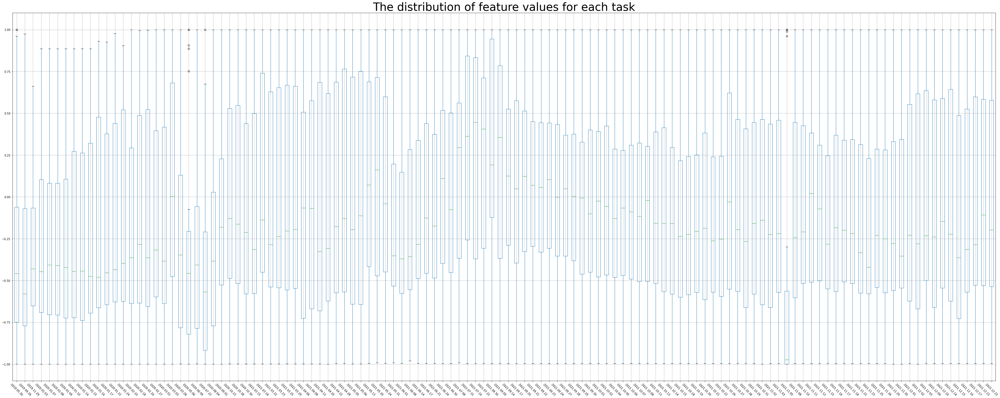

In [113]:
#decide the figure size and autolayout
plt.rcParams["figure.figsize"] = [50, 20]
plt.rcParams["figure.autolayout"] = True
#Create a boxplot that shows the distribution of feature values for each task by for loop
for col in eda_tasks.columns:
    eda_tasks[col] = pd.to_numeric(eda_tasks[col])
eda_tasks.boxplot()
#add title for boxplot
plt.title('The distribution of feature values for each task', fontsize=40 )
#rotate the x-axis lable 
plt.xticks(rotation=-45)
plt.show()

## Part 2.2: Distribution of Errors in Naive Model

In [114]:
#copy cleaned_cost to eda_cost
eda_cost = cleaned_cost.copy()

#create dataframe for minimum cost of each task
min_cost = pd.DataFrame(eda_cost.groupby(['Task ID'])['Cost'].min())

#set Task ID as index
eda_cost.index = eda_cost['Task ID']
eda_cost.drop(['Task ID'],axis=1, inplace = True)

#check whether the task id in both dataframe match
print(eda_cost.index.unique() == min_cost.index)

#calculate the error by automatic index alignment
eda_cost['Error'] = min_cost['Cost'] - eda_cost['Cost']


[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True]


In [115]:
min_cost

,Cost
Task ID,
2019 05 30,0.290967
2019 09 26,0.283752
2019 11 29,0.284575
2020 01 03,0.310395
2020 01 07,0.316962
...,...
2021 12 15,0.387038
2021 12 16,0.394986
2021 12 17,0.417426


In [116]:
eda_cost

,Supplier ID,Cost,Error
Task ID,,,
2019 05 30,S1,0.478219,-0.187252
2019 05 30,S3,0.521679,-0.230711
2019 05 30,S4,0.307331,-0.016363
2019 05 30,S5,0.357689,-0.066722
2019 05 30,S6,0.351982,-0.061014
...,...,...,...
2021 12 22,S60,0.410605,-0.032737
2021 12 22,S61,0.410376,-0.032508
2021 12 22,S62,0.407884,-0.030016


In [117]:
#calculate RMSE for each supplier
eda_cost['Error_square'] = eda_cost['Error']**2
sum_of_square = eda_cost.groupby('Supplier ID')['Error_square'].agg('sum')
num = eda_cost.groupby('Supplier ID')['Error_square'].agg('count')
rmse = (sum_of_square/num)**0.5

#sort RMSE in ascending order
rmse = rmse.reset_index()
rmse = rmse.rename(columns = {'Error_square':'RMSE'})
rmse = rmse.sort_values(by='RMSE')
rmse = rmse.reset_index()
rmse.drop(['index'],axis=1,inplace=True)

#get Supplier ID order in ascending order of RMSE
order = rmse['Supplier ID']

In [118]:
rmse

,Supplier ID,RMSE
0,S56,0.025594
1,S34,0.028951
2,S15,0.031017
3,S33,0.031501
4,S51,0.032240
...,...,...
58,S44,0.074172
59,S21,0.074644
60,S1,0.081803
61,S26,0.082901


In [119]:
#get error distribution of suppliers
group = eda_cost.groupby('Supplier ID')['Error'].apply(list)

#sort the suppliers in ascending order of RMSE
group = group.reindex(index = order)

In [120]:
group

Supplier ID
S56    [-0.011245951000000032, -0.030266194999999996,...
S34    [-0.022619833000000034, -0.03195013099999999, ...
S15    [-0.016724532000000014, -0.04026087700000003, ...
S33    [-0.035538367000000015, -0.03803285500000003, ...
S51    [-0.03314564400000003, -0.047153133000000014, ...
                             ...                        
S44    [-0.08182526100000004, -0.02312344799999999, -...
S21    [-0.13102048100000002, -0.03766159000000002, -...
S1     [-0.18725150900000004, -0.12403260999999999, -...
S26    [-0.128761309, -0.06412221499999998, -0.145150...
S3     [-0.23071141899999997, -0.10603168200000002, -...
Name: Error, Length: 63, dtype: object

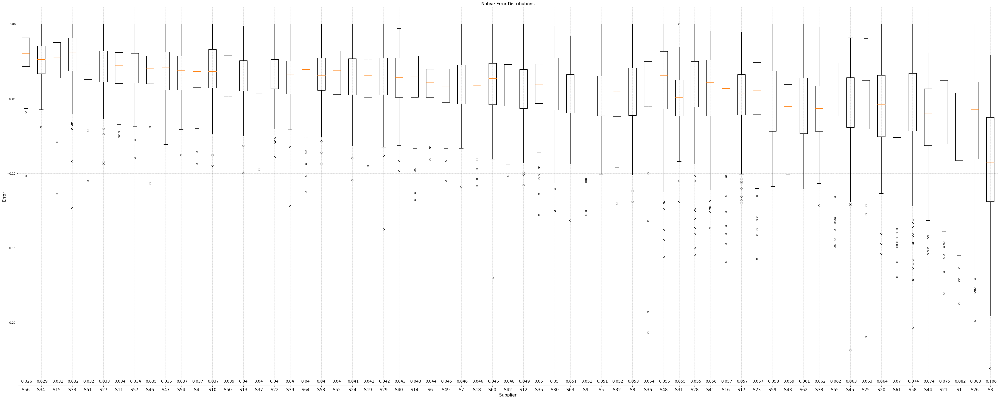

In [121]:
#set plot size
fig, ax = plt.subplots(figsize=(50, 20))

#set title & labels
ax.set_title('Native Error Distributions', size=15)
ax.set_xlabel('Supplier',size=15)
ax.set_ylabel('Error',size=15)

#set x-axis labels
labels = group.index.to_list()
ax.set_xticklabels(labels, size=15)

#set gridlines
ax.grid(True, 'major', 'both', ls='--', lw=.5, c='k', alpha=.3)

#annotate the RMSE for each supplier
height = -0.24
width = np.arange(0.7,64.8,1)

for i in range(len(rmse)):
    plt.annotate(round(rmse['RMSE'][i], 3), xy=(width[i], height), size=14)

#plot box plot
plt.boxplot(group)

#show plot
plt.show()

In [122]:
print(f"The mean of RMSE: {rmse['RMSE'].mean()}" )
print(f"The median of RMSE: {rmse['RMSE'].median()}")
print(f"The lowest RMSE: {rmse['RMSE'].min()}")
print(f"The highest RMSE: {rmse['RMSE'].max()}")

The mean of RMSE: 0.049922145526230824
The median of RMSE: 0.04814007102103136
The lowest RMSE: 0.025594303791908402
The highest RMSE: 0.10629545198024438


From the plot, we can identify suppliers with lower RMSE. Suppliers with lower RMSE generally have lower costs in different tasks.

## Part 2.3: Cost values matrix

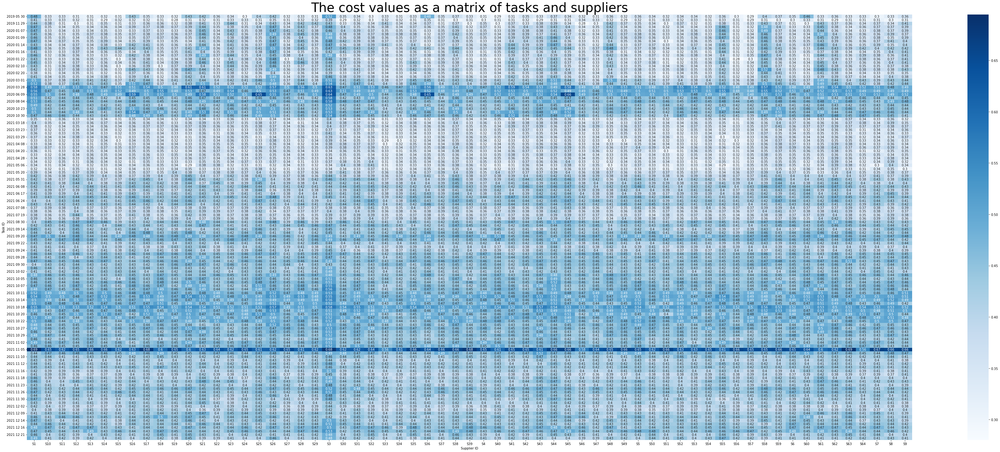

In [123]:
#change the dataset to wide
c_hmp = cleaned_cost.pivot(index='Task ID', values = 'Cost', columns = 'Supplier ID')
#create a heatmap shows the cost values as a matrix of tasks (rows) and suppliers (columns)
sn.heatmap(c_hmp,annot=True,cmap='Blues')
#add the title for heatmap
plt.title('The cost values as a matrix of tasks and suppliers', fontsize=40)
plt.show()


## Part 2.4: Extra Plots

### Added plot (Line Graph for supplier and cost)

[Text(0.5, 1.0, 'Suppliers’ Costs for Different Task IDs'),
 Text(0.5, 0, 'Task ID'),
 Text(0, 0.5, 'Cost')]

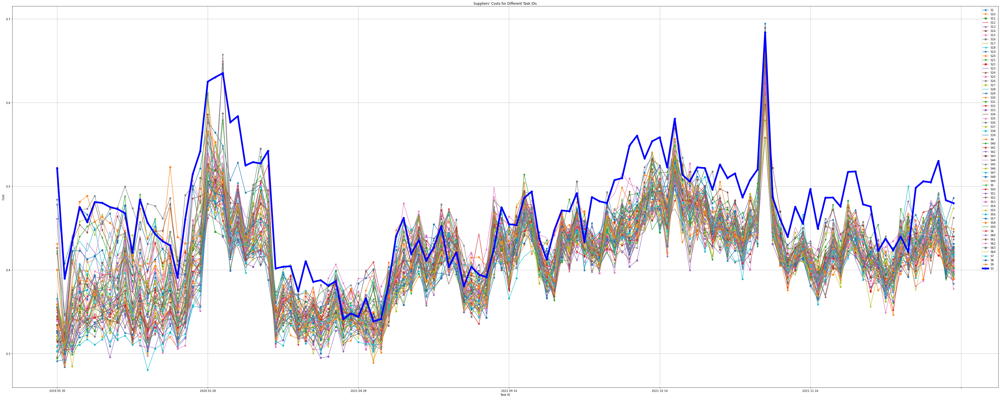

In [124]:
#change the dataset to wide
tstpp = cleaned_cost.pivot(index='Task ID',columns='Supplier ID',values='Cost')
#create a copy for wide dataset
tstp = tstpp.copy()
#create a copy with droping 'S3' from columns
tstp3 = tstp.drop("S3", axis='columns')
#create a copy with removing 'S3'
tstps3 = tstp.pop('S3')

#decide the figure size and autolayout
plt.rcParams['figure.figsize'] = [50,20]
plt.rcParams["figure.autolayout"] = True
#decide the ponit shape 
markerss = ['d', 'v', 's', '', '^', 'o', 'X', 'D', '', '<','p']
#create a Line Graph for supplier and cost
axl = tstp3.plot(kind='line')
#high light the 'S3' on graph
axxl = tstps3.plot(kind='line',linewidth=6, color='blue') 


#assign the shape by for loop
for i, line in enumerate(axl.get_lines()): 
    line.set_marker(markerss[i % len(markerss)]) 
    axl.legend()
 
    

#add lines on graph
plt.grid()
#add title for graph
plt.title('Suppliers’ Costs for Different Task IDs', fontsize=40)
#add lables
plt.gca().set(ylabel = "Cost")
plt.gca().set(title = "Suppliers’ Costs for Different Task IDs",
              xlabel = "Task ID",
              ylabel = "Cost")

### Added plot (Boxplot for supplier and cost)

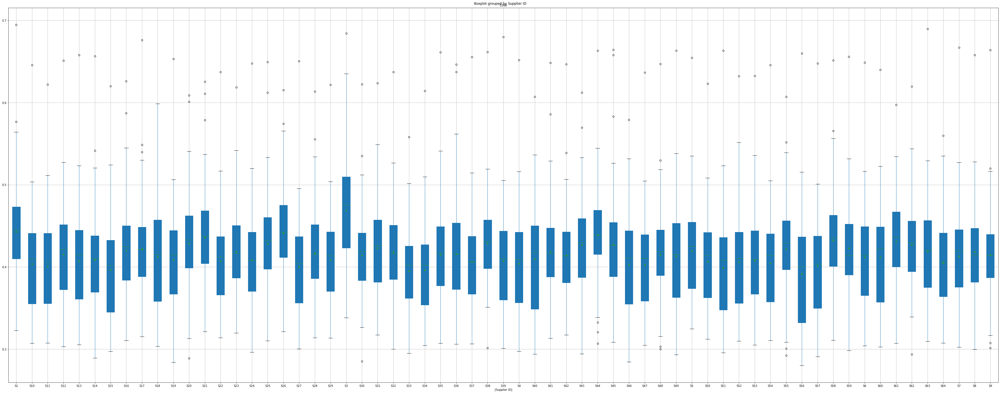

In [125]:
#decide the  figure size and autolayout
plt.rcParams["figure.figsize"] = [50, 20]
plt.rcParams["figure.autolayout"] = True
#create a boxplot for cost by supplier
cleaned_cost.boxplot(by="Supplier ID", showmeans=True, patch_artist=True)
plt.show()


## Part 2.5: Saving Dataframe for ML

In [126]:
#save the prepared supplier dataframe under this name 
final_cost = cleaned_cost
final_cost.head()

,Task ID,Supplier ID,Cost
0,2019 05 30,S1,0.478219
1,2019 05 30,S3,0.521679
2,2019 05 30,S4,0.307331
3,2019 05 30,S5,0.357689
4,2019 05 30,S6,0.351982


In [127]:
final_cost.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7560 entries, 0 to 7559
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Task ID      7560 non-null   object 
 1   Supplier ID  7560 non-null   object 
 2   Cost         7560 non-null   float64
dtypes: float64(1), object(2)
memory usage: 177.3+ KB


In [128]:
#save the prepared supplier dataframe under this name 
final_suppliers = cleaned_suppliers
final_suppliers.head()

,Supplier ID,SF1,SF2,SF3,SF4,SF5,SF6,SF7,SF8,SF9,SF10,SF11,SF12,SF13,SF14,SF15,SF16,SF17,SF18
0,S1,-0.818182,-0.052632,-0.052632,-0.818182,-0.818182,-0.818182,0.333333,-0.707317,-0.052632,-0.632653,-0.052632,0.142857,-0.052632,-0.052632,-0.538462,0.2,-0.996,0.5
1,S3,-0.818182,-0.052632,-0.052632,-0.818182,-0.818182,-0.818182,0.333333,-0.707317,-0.052632,-0.632653,-0.052632,0.142857,-0.052632,-0.052632,-0.538462,0.2,-1.000,0.5
2,S4,-0.818182,-0.052632,-0.052632,-0.818182,-0.818182,-0.818182,0.333333,-0.707317,-0.052632,-0.632653,-0.052632,0.142857,-0.052632,-0.052632,-0.538462,0.2,-0.800,0.5
3,S5,-1.000000,-0.052632,-1.000000,1.000000,1.000000,-0.818182,0.333333,-0.707317,-1.000000,-0.632653,1.000000,1.000000,1.000000,-1.000000,1.000000,0.2,-0.400,-1.0
4,S6,-1.000000,-1.000000,1.000000,-1.000000,1.000000,1.000000,-0.333333,-1.000000,1.000000,-1.000000,1.000000,-1.000000,-1.000000,1.000000,-0.538462,0.2,-0.700,-1.0


In [129]:
final_suppliers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63 entries, 0 to 62
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Supplier ID  63 non-null     object 
 1   SF1          63 non-null     float64
 2   SF2          63 non-null     float64
 3   SF3          63 non-null     float64
 4   SF4          63 non-null     float64
 5   SF5          63 non-null     float64
 6   SF6          63 non-null     float64
 7   SF7          63 non-null     float64
 8   SF8          63 non-null     float64
 9   SF9          63 non-null     float64
 10  SF10         63 non-null     float64
 11  SF11         63 non-null     float64
 12  SF12         63 non-null     float64
 13  SF13         63 non-null     float64
 14  SF14         63 non-null     float64
 15  SF15         63 non-null     float64
 16  SF16         63 non-null     float64
 17  SF17         63 non-null     float64
 18  SF18         63 non-null     float64
dtypes: float64

In [130]:
#save the prepared tasks dataframe under this name 
final_tasks = cleaned_tasks
final_tasks.head()

,Task ID,TF1,TF16,TF17,TF19,TF20,TF21,TF23,TF26,TF27,...,TF67,TF71,TF77,TF85,TF91,TF103,TF105,TF109,TF111,TF115
0,2019 05 30,1.000000,-0.559193,-0.350672,1.000000,0.961792,-0.379070,0.421053,0.547957,-0.599289,...,-0.999425,-0.472868,-0.784169,-0.770894,-0.684107,-0.401560,-0.925939,-0.881587,-0.708961,-0.105403
1,2019 09 26,0.974504,0.017794,-0.560807,0.662732,0.961792,-1.000000,0.333333,0.444928,-0.599289,...,-1.000000,-0.658915,-0.773527,-0.923091,-0.622902,-0.553691,-0.890053,-0.747656,-0.450189,-0.330913
2,2019 11 29,-0.257790,-0.424278,-0.642854,0.662732,-0.951252,-0.001434,0.578947,0.557054,-0.599289,...,-0.999307,-0.798450,-0.653773,-0.700180,-0.630800,-0.434418,-0.939066,-0.876756,0.105757,-0.046935
3,2020 01 03,0.328612,-0.435824,-0.627916,0.662732,0.886693,-0.017407,0.561404,0.839891,-0.599289,...,-0.999354,-0.875969,-0.710788,-0.712838,-0.630800,-0.456214,-0.936777,-0.860495,0.117408,-0.357917
4,2020 01 07,0.572238,-0.353895,-0.624852,0.662732,0.886693,-0.147246,0.491228,0.842061,-0.599289,...,-0.999533,-0.891473,-0.706875,-0.788918,-0.630800,-0.460648,-0.930154,-0.845885,0.117408,-0.199185


In [131]:
final_tasks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120 entries, 0 to 119
Data columns (total 27 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Task ID  120 non-null    object 
 1   TF1      120 non-null    float64
 2   TF16     120 non-null    float64
 3   TF17     120 non-null    float64
 4   TF19     120 non-null    float64
 5   TF20     120 non-null    float64
 6   TF21     120 non-null    float64
 7   TF23     120 non-null    float64
 8   TF26     120 non-null    float64
 9   TF27     120 non-null    float64
 10  TF30     120 non-null    float64
 11  TF32     120 non-null    float64
 12  TF33     120 non-null    float64
 13  TF36     120 non-null    float64
 14  TF37     120 non-null    float64
 15  TF45     120 non-null    float64
 16  TF52     120 non-null    float64
 17  TF67     120 non-null    float64
 18  TF71     120 non-null    float64
 19  TF77     120 non-null    float64
 20  TF85     120 non-null    float64
 21  TF91     120 non

# Part 3: ML Model fitting and scoring

## Part 3.1 Merging Columns

In [132]:
#retireving the columns based on the results above
filtered_suppliers_factor = list(final_suppliers.columns[1:])
filtered_tasks_factor = list(final_tasks.columns[1:])

suppliers_factor_list = ["Supplier ID"] + filtered_suppliers_factor
tasks_factor_list = ["Task ID"] + filtered_tasks_factor

In [133]:
#merging the dataframe cost and tasks
final_df = final_cost.merge(final_tasks, how = "left", on = ["Task ID"])
print(final_df.shape)
final_df.head()

(7560, 29)


,Task ID,Supplier ID,Cost,TF1,TF16,TF17,TF19,TF20,TF21,TF23,...,TF67,TF71,TF77,TF85,TF91,TF103,TF105,TF109,TF111,TF115
0,2019 05 30,S1,0.478219,1.0,-0.559193,-0.350672,1.0,0.961792,-0.37907,0.421053,...,-0.999425,-0.472868,-0.784169,-0.770894,-0.684107,-0.40156,-0.925939,-0.881587,-0.708961,-0.105403
1,2019 05 30,S3,0.521679,1.0,-0.559193,-0.350672,1.0,0.961792,-0.37907,0.421053,...,-0.999425,-0.472868,-0.784169,-0.770894,-0.684107,-0.40156,-0.925939,-0.881587,-0.708961,-0.105403
2,2019 05 30,S4,0.307331,1.0,-0.559193,-0.350672,1.0,0.961792,-0.37907,0.421053,...,-0.999425,-0.472868,-0.784169,-0.770894,-0.684107,-0.40156,-0.925939,-0.881587,-0.708961,-0.105403
3,2019 05 30,S5,0.357689,1.0,-0.559193,-0.350672,1.0,0.961792,-0.37907,0.421053,...,-0.999425,-0.472868,-0.784169,-0.770894,-0.684107,-0.40156,-0.925939,-0.881587,-0.708961,-0.105403
4,2019 05 30,S6,0.351982,1.0,-0.559193,-0.350672,1.0,0.961792,-0.37907,0.421053,...,-0.999425,-0.472868,-0.784169,-0.770894,-0.684107,-0.40156,-0.925939,-0.881587,-0.708961,-0.105403


In [134]:
#merging the dataframe new_df and suppliers 
final_df = final_df.merge(final_suppliers, how = "left", on = ["Supplier ID"])
print(final_df.shape)
final_df.head()

(7560, 47)


,Task ID,Supplier ID,Cost,TF1,TF16,TF17,TF19,TF20,TF21,TF23,...,SF9,SF10,SF11,SF12,SF13,SF14,SF15,SF16,SF17,SF18
0,2019 05 30,S1,0.478219,1.0,-0.559193,-0.350672,1.0,0.961792,-0.37907,0.421053,...,-0.052632,-0.632653,-0.052632,0.142857,-0.052632,-0.052632,-0.538462,0.2,-0.996,0.5
1,2019 05 30,S3,0.521679,1.0,-0.559193,-0.350672,1.0,0.961792,-0.37907,0.421053,...,-0.052632,-0.632653,-0.052632,0.142857,-0.052632,-0.052632,-0.538462,0.2,-1.000,0.5
2,2019 05 30,S4,0.307331,1.0,-0.559193,-0.350672,1.0,0.961792,-0.37907,0.421053,...,-0.052632,-0.632653,-0.052632,0.142857,-0.052632,-0.052632,-0.538462,0.2,-0.800,0.5
3,2019 05 30,S5,0.357689,1.0,-0.559193,-0.350672,1.0,0.961792,-0.37907,0.421053,...,-1.000000,-0.632653,1.000000,1.000000,1.000000,-1.000000,1.000000,0.2,-0.400,-1.0
4,2019 05 30,S6,0.351982,1.0,-0.559193,-0.350672,1.0,0.961792,-0.37907,0.421053,...,1.000000,-1.000000,1.000000,-1.000000,-1.000000,1.000000,-0.538462,0.2,-0.700,-1.0


## Part 3.2: Train-Test-Split

In [135]:
#retrieving a unique list of all the task smaples 
Groups = final_df["Task ID"].unique()
print(len(Groups))
print(Groups)

120
['2019 05 30' '2019 09 26' '2019 11 29' '2020 01 03' '2020 01 07'
 '2020 01 08' '2020 01 09' '2020 01 10' '2020 01 14' '2020 01 15'
 '2020 01 16' '2020 01 17' '2020 01 22' '2020 01 24' '2020 02 10'
 '2020 02 18' '2020 02 20' '2020 02 27' '2020 03 01' '2020 03 03'
 '2020 03 28' '2020 05 06' '2020 06 09' '2020 07 22' '2020 08 04'
 '2020 09 01' '2020 10 23' '2020 10 28' '2020 10 30' '2021 03 15'
 '2021 03 18' '2021 03 22' '2021 03 23' '2021 03 25' '2021 03 29'
 '2021 04 06' '2021 04 08' '2021 04 12' '2021 04 20' '2021 04 22'
 '2021 04 28' '2021 05 05' '2021 05 06' '2021 05 13' '2021 05 20'
 '2021 05 24' '2021 05 31' '2021 06 01' '2021 06 08' '2021 06 14'
 '2021 06 17' '2021 06 21' '2021 06 24' '2021 06 30' '2021 07 08'
 '2021 07 15' '2021 07 19' '2021 07 22' '2021 08 30' '2021 09 09'
 '2021 09 14' '2021 09 17' '2021 09 20' '2021 09 21' '2021 09 22'
 '2021 09 23' '2021 09 24' '2021 09 27' '2021 09 28' '2021 09 29'
 '2021 09 30' '2021 10 01' '2021 10 02' '2021 10 04' '2021 10 05'
 '2021

In [136]:
#generating a set of indexes that would be in the test set randomly 
random.seed(seed)
test_index = random.sample(range(0,len(Groups)),20)
print(test_index)

#select these task_id based on the index 
TestGroups = Groups[test_index]
print(TestGroups)

[81, 14, 3, 94, 35, 31, 28, 17, 13, 86, 114, 69, 11, 75, 54, 4, 27, 29, 64, 77]
['2021 10 15' '2020 02 10' '2020 01 03' '2021 11 05' '2021 04 06'
 '2021 03 22' '2020 10 30' '2020 02 27' '2020 01 24' '2021 10 22'
 '2021 12 14' '2021 09 29' '2020 01 17' '2021 10 06' '2021 07 08'
 '2020 01 07' '2020 10 28' '2021 03 15' '2021 09 22' '2021 10 08']


In [137]:
#retrieving the training set 
train = final_df[~final_df["Task ID"].isin(TestGroups)]
print(train.shape)
train.head()

(6300, 47)


,Task ID,Supplier ID,Cost,TF1,TF16,TF17,TF19,TF20,TF21,TF23,...,SF9,SF10,SF11,SF12,SF13,SF14,SF15,SF16,SF17,SF18
0,2019 05 30,S1,0.478219,1.0,-0.559193,-0.350672,1.0,0.961792,-0.37907,0.421053,...,-0.052632,-0.632653,-0.052632,0.142857,-0.052632,-0.052632,-0.538462,0.2,-0.996,0.5
1,2019 05 30,S3,0.521679,1.0,-0.559193,-0.350672,1.0,0.961792,-0.37907,0.421053,...,-0.052632,-0.632653,-0.052632,0.142857,-0.052632,-0.052632,-0.538462,0.2,-1.000,0.5
2,2019 05 30,S4,0.307331,1.0,-0.559193,-0.350672,1.0,0.961792,-0.37907,0.421053,...,-0.052632,-0.632653,-0.052632,0.142857,-0.052632,-0.052632,-0.538462,0.2,-0.800,0.5
3,2019 05 30,S5,0.357689,1.0,-0.559193,-0.350672,1.0,0.961792,-0.37907,0.421053,...,-1.000000,-0.632653,1.000000,1.000000,1.000000,-1.000000,1.000000,0.2,-0.400,-1.0
4,2019 05 30,S6,0.351982,1.0,-0.559193,-0.350672,1.0,0.961792,-0.37907,0.421053,...,1.000000,-1.000000,1.000000,-1.000000,-1.000000,1.000000,-0.538462,0.2,-0.700,-1.0


In [138]:
#retrieving the testing set
test = final_df[final_df["Task ID"].isin(TestGroups)]
print(test.shape)
print(test["Task ID"].unique())
test.head()

(1260, 47)
['2020 01 03' '2020 01 07' '2020 01 17' '2020 01 24' '2020 02 10'
 '2020 02 27' '2020 10 28' '2020 10 30' '2021 03 15' '2021 03 22'
 '2021 04 06' '2021 07 08' '2021 09 22' '2021 09 29' '2021 10 06'
 '2021 10 08' '2021 10 15' '2021 10 22' '2021 11 05' '2021 12 14']


,Task ID,Supplier ID,Cost,TF1,TF16,TF17,TF19,TF20,TF21,TF23,...,SF9,SF10,SF11,SF12,SF13,SF14,SF15,SF16,SF17,SF18
189,2020 01 03,S1,0.473479,0.328612,-0.435824,-0.627916,0.662732,0.886693,-0.017407,0.561404,...,-0.052632,-0.632653,-0.052632,0.142857,-0.052632,-0.052632,-0.538462,0.2,-0.996,0.5
190,2020 01 03,S3,0.475218,0.328612,-0.435824,-0.627916,0.662732,0.886693,-0.017407,0.561404,...,-0.052632,-0.632653,-0.052632,0.142857,-0.052632,-0.052632,-0.538462,0.2,-1.000,0.5
191,2020 01 03,S4,0.372457,0.328612,-0.435824,-0.627916,0.662732,0.886693,-0.017407,0.561404,...,-0.052632,-0.632653,-0.052632,0.142857,-0.052632,-0.052632,-0.538462,0.2,-0.800,0.5
192,2020 01 03,S5,0.355952,0.328612,-0.435824,-0.627916,0.662732,0.886693,-0.017407,0.561404,...,-1.000000,-0.632653,1.000000,1.000000,1.000000,-1.000000,1.000000,0.2,-0.400,-1.0
193,2020 01 03,S6,0.331406,0.328612,-0.435824,-0.627916,0.662732,0.886693,-0.017407,0.561404,...,1.000000,-1.000000,1.000000,-1.000000,-1.000000,1.000000,-0.538462,0.2,-0.700,-1.0


In [139]:
X_train = train[filtered_suppliers_factor + filtered_tasks_factor]
print(X_train.shape)
X_train.head()

(6300, 44)


,SF1,SF2,SF3,SF4,SF5,SF6,SF7,SF8,SF9,SF10,...,TF67,TF71,TF77,TF85,TF91,TF103,TF105,TF109,TF111,TF115
0,-0.818182,-0.052632,-0.052632,-0.818182,-0.818182,-0.818182,0.333333,-0.707317,-0.052632,-0.632653,...,-0.999425,-0.472868,-0.784169,-0.770894,-0.684107,-0.40156,-0.925939,-0.881587,-0.708961,-0.105403
1,-0.818182,-0.052632,-0.052632,-0.818182,-0.818182,-0.818182,0.333333,-0.707317,-0.052632,-0.632653,...,-0.999425,-0.472868,-0.784169,-0.770894,-0.684107,-0.40156,-0.925939,-0.881587,-0.708961,-0.105403
2,-0.818182,-0.052632,-0.052632,-0.818182,-0.818182,-0.818182,0.333333,-0.707317,-0.052632,-0.632653,...,-0.999425,-0.472868,-0.784169,-0.770894,-0.684107,-0.40156,-0.925939,-0.881587,-0.708961,-0.105403
3,-1.000000,-0.052632,-1.000000,1.000000,1.000000,-0.818182,0.333333,-0.707317,-1.000000,-0.632653,...,-0.999425,-0.472868,-0.784169,-0.770894,-0.684107,-0.40156,-0.925939,-0.881587,-0.708961,-0.105403
4,-1.000000,-1.000000,1.000000,-1.000000,1.000000,1.000000,-0.333333,-1.000000,1.000000,-1.000000,...,-0.999425,-0.472868,-0.784169,-0.770894,-0.684107,-0.40156,-0.925939,-0.881587,-0.708961,-0.105403


In [140]:
X_test = test[filtered_suppliers_factor + filtered_tasks_factor]
print(X_test.shape)
X_test.head()

(1260, 44)


,SF1,SF2,SF3,SF4,SF5,SF6,SF7,SF8,SF9,SF10,...,TF67,TF71,TF77,TF85,TF91,TF103,TF105,TF109,TF111,TF115
189,-0.818182,-0.052632,-0.052632,-0.818182,-0.818182,-0.818182,0.333333,-0.707317,-0.052632,-0.632653,...,-0.999354,-0.875969,-0.710788,-0.712838,-0.6308,-0.456214,-0.936777,-0.860495,0.117408,-0.357917
190,-0.818182,-0.052632,-0.052632,-0.818182,-0.818182,-0.818182,0.333333,-0.707317,-0.052632,-0.632653,...,-0.999354,-0.875969,-0.710788,-0.712838,-0.6308,-0.456214,-0.936777,-0.860495,0.117408,-0.357917
191,-0.818182,-0.052632,-0.052632,-0.818182,-0.818182,-0.818182,0.333333,-0.707317,-0.052632,-0.632653,...,-0.999354,-0.875969,-0.710788,-0.712838,-0.6308,-0.456214,-0.936777,-0.860495,0.117408,-0.357917
192,-1.000000,-0.052632,-1.000000,1.000000,1.000000,-0.818182,0.333333,-0.707317,-1.000000,-0.632653,...,-0.999354,-0.875969,-0.710788,-0.712838,-0.6308,-0.456214,-0.936777,-0.860495,0.117408,-0.357917
193,-1.000000,-1.000000,1.000000,-1.000000,1.000000,1.000000,-0.333333,-1.000000,1.000000,-1.000000,...,-0.999354,-0.875969,-0.710788,-0.712838,-0.6308,-0.456214,-0.936777,-0.860495,0.117408,-0.357917


In [141]:
y_train = train["Cost"]
print(y_train.shape)
y_train.head()

(6300,)


0    0.478219
1    0.521679
2    0.307331
3    0.357689
4    0.351982
Name: Cost, dtype: float64

In [142]:
y_test = test["Cost"]
print(y_test.shape)
y_test.head()

(1260,)


189    0.473479
190    0.475218
191    0.372457
192    0.355952
193    0.331406
Name: Cost, dtype: float64

## Part 3.3: ML model testing 

In [143]:
#fitting the RidgeRegression model
ridge_reg_base = Ridge(random_state = seed)
ridge_reg_base.fit(X_train, y_train)

Ridge(random_state=42)

In [144]:
#checking on the base params
ridge_reg_base.get_params()

{'alpha': 1.0,
 'copy_X': True,
 'fit_intercept': True,
 'max_iter': None,
 'normalize': 'deprecated',
 'positive': False,
 'random_state': 42,
 'solver': 'auto',
 'tol': 0.001}

In [145]:
#checking the intercept terms 
ridge_reg_base.intercept_

0.6060082363089419

In [146]:
#checking the coefficient terms
ridge_reg_base.coef_

array([ 2.32254997e-03, -3.77173579e-04, -4.27325546e-03, -2.88672332e-03,
        8.52836072e-04, -1.02970631e-04, -5.24865561e-03, -8.04381500e-04,
        3.12505554e-04,  6.88519082e-03, -3.55385357e-04, -1.62341355e-03,
        1.43667807e-03,  8.55294062e-04,  1.54977642e-04,  4.38869343e-04,
       -3.55414734e-03, -1.94109648e-03,  1.34193796e-02, -4.79446973e-02,
        1.41776511e-01, -2.72802261e-01,  2.63880902e-04,  3.53353781e-02,
        2.69461199e-02,  5.36033381e-02,  8.23477087e-03, -1.74595570e-02,
       -1.22405505e-01,  1.31061994e-01, -8.38586872e-03,  6.76224969e-02,
       -1.31577259e-01,  5.09872737e-02, -8.10924815e-04,  4.31074591e-02,
       -4.01408898e-02, -2.33850396e-02,  2.05999740e-02, -1.78187481e-02,
        3.80841696e-02, -7.70515840e-02, -3.50885487e-02,  9.52494556e-03])

In [147]:
#checking the score on train set 
ridge_reg_base.score(X_train, y_train)

0.6929898347902632

In [148]:
#checking the score on test set 
ridge_reg_base.score(X_test, y_test)

0.15391582593649367

## Part 3.4: Checking based on self defined error functions

In [149]:
#self defined function to retrieve the chosen supplier, error and rmse given a data set and the prediction 
def self_defined_rmse_v3(data, y_pred):
    data["pred_cost"] = y_pred
    result_df_groupped = data.groupby("Task ID")["Cost", "pred_cost"]
    errors = []
    suppliers = []
    task_id = []
    
    #loppin through the groupby object (by task id) 
    for index, data in result_df_groupped:
        cost = data["Cost"].values
        pred = data["pred_cost"].values
        #computing error 
        real_cost = np.min(cost)
        pred_cost = cost[np.argmin(pred)]
        errors.append(real_cost - pred_cost)
        #saving task id and selected suppliers
        task_id.append(index)
        suppliers.append(np.argmin(pred))
    #computing rmse 
    final_rmse = ((np.array(errors)**2).sum()/len(errors))**0.5
    return(errors, suppliers, task_id, final_rmse)

In [150]:
#a helper function to validate the model on train and test set given the model 
def validate_model(model, train, test, X_train, X_test):
    print("Validation on Train Set")
    y_pred = model.predict(X_train)
    y_pred.shape

    data = train.copy()
    #calling function from above 
    errors, suppliers, task_id, final_rmse = self_defined_rmse_v3(data, y_pred)
    print(f"The final rmse {final_rmse}")
    print(f"\nTask IDs")
    print(task_id)
    print(f"\nChosen Supppliers")
    print(suppliers)
    print(f"\nErrors")
    print(errors)
    
    df_train = pd.DataFrame({"Train_Test":["train"]*len(task_id),
                            "Task_ID": task_id, 
                            "Selected_Supplier": suppliers,
                            "Errors": errors})
    
    print("\nValidation on Test Set")
    y_pred = model.predict(X_test)
    y_pred.shape

    data = test.copy()
    #calling function from above 
    errors, suppliers, task_id, final_rmse = self_defined_rmse_v3(data, y_pred)
    print(f"The final rmse {final_rmse}")
    print(f"\nTask IDs")
    print(task_id)
    print(f"\nChosen Supppliers")
    print(suppliers)
    print(f"\nErrors")
    print(errors)

    df_test = pd.DataFrame({"Train_Test":["test"]*len(task_id),
                        "Task_ID": task_id, 
                        "Selected_Supplier": suppliers,
                        "Errors": errors})
    
    #retuning the dataframe 
    df_return = pd.concat([df_train, df_test], ignore_index = True)
    
    return(df_return)

In [151]:
#saving the model results for the base model 
ridge_reg_base_results = validate_model(ridge_reg_base, train, test, X_train, X_test)
ridge_reg_base_results.to_csv("./ridge_reg_base_results.csv", index = False)

Validation on Train Set
The final rmse 0.03922037515723274

Task IDs
['2019 05 30', '2019 09 26', '2019 11 29', '2020 01 08', '2020 01 09', '2020 01 10', '2020 01 14', '2020 01 15', '2020 01 16', '2020 01 22', '2020 02 18', '2020 02 20', '2020 03 01', '2020 03 03', '2020 03 28', '2020 05 06', '2020 06 09', '2020 07 22', '2020 08 04', '2020 09 01', '2020 10 23', '2021 03 18', '2021 03 23', '2021 03 25', '2021 03 29', '2021 04 08', '2021 04 12', '2021 04 20', '2021 04 22', '2021 04 28', '2021 05 05', '2021 05 06', '2021 05 13', '2021 05 20', '2021 05 24', '2021 05 31', '2021 06 01', '2021 06 08', '2021 06 14', '2021 06 17', '2021 06 21', '2021 06 24', '2021 06 30', '2021 07 15', '2021 07 19', '2021 07 22', '2021 08 30', '2021 09 09', '2021 09 14', '2021 09 17', '2021 09 20', '2021 09 21', '2021 09 23', '2021 09 24', '2021 09 27', '2021 09 28', '2021 09 30', '2021 10 01', '2021 10 02', '2021 10 04', '2021 10 05', '2021 10 07', '2021 10 11', '2021 10 13', '2021 10 14', '2021 10 18', '2021 

## Part 3.5: Comparison

### The comparison is mentioned in the report

# Part 4: Cross-validation

In [152]:
tasks_id = train["Task ID"].astype(str)
tasks_id

0       2019 05 30
1       2019 05 30
2       2019 05 30
3       2019 05 30
4       2019 05 30
           ...    
7555    2021 12 22
7556    2021 12 22
7557    2021 12 22
7558    2021 12 22
7559    2021 12 22
Name: Task ID, Length: 6300, dtype: object

In [153]:
#customized scoring function 
def customized_error_v2(y, y_pred):
    #converting array to 1d format 
    y_orig = np.array(y).ravel()
    y_pred = np.array(y_pred).ravel()
    
    #compuring the actual minimum in the test set 
    orig = np.min(y_orig)
                               
    #retrieving the cost of the minimum index based on the predicted cost 
    pred = y_orig[np.argmin(y_pred)]
                               
    error = orig-pred #error as the original - machine learning prediction 
    return(error)

#creating a self defined scorer
error_func_v2 = make_scorer(customized_error_v2)

In [154]:
#initialzing the empty instance of 
ridge_reg_cv = Ridge(random_state = seed)

#initializing the cross validation method 
logo = LeaveOneGroupOut()

#performing the cross validation 
errors = cross_val_score(estimator = ridge_reg_cv, #specifying the regression instance
                         X = X_train, y = y_train, #specifying the x and y data frames
                         groups = tasks_id, #specifying for group
                         scoring = error_func_v2, #leveraging our own scoring method                       
                         cv = logo, #setting the cv to be LeaveOneGroup out 
                         n_jobs = -1) #utilizing all of the cpus 

#visualizing the errors
print(f"There are {len(errors)} errors in total")
print(f"the average errors are {np.mean(errors)} ")
print(f"the standard deviation of errors {np.std(errors)}")

#compuring the rmse 
rmse = ((errors**2).sum()/len(errors))**0.5
print(f"\nThe RMSE is {rmse}")

#visualizing the errors 
print("\nThe errors are:")
print(errors)

There are 100 errors in total
the average errors are -0.03606257629000001 
the standard deviation of errors 0.016999140623758725

The RMSE is 0.03986828552393988

The errors are:
[-0.03726871 -0.02878258 -0.02882436 -0.03503418 -0.03119965 -0.05818814
 -0.0418232  -0.03909421 -0.02008691 -0.03323941 -0.02577738 -0.00648026
 -0.05645031 -0.05190378 -0.04367703 -0.07883552 -0.04701991 -0.02989899
 -0.01196966 -0.01194671 -0.02463263 -0.02534907 -0.02776225 -0.03711087
 -0.05583665 -0.06360599 -0.04797595 -0.04411201 -0.02111751 -0.04592923
 -0.02770073 -0.07074269 -0.04586471 -0.05227307 -0.03121113 -0.02287107
 -0.02164018 -0.0368345  -0.05518855 -0.0342606  -0.03197956 -0.0628206
 -0.03666254 -0.01864217 -0.02795664 -0.0474281  -0.02375969 -0.04823423
 -0.03089925 -0.05326283 -0.05553566 -0.03007653 -0.03654025 -0.03396842
 -0.01106246 -0.04865203 -0.01820072 -0.03546708 -0.0080816  -0.00029611
 -0.00596082 -0.01256891 -0.0016011  -0.04774845 -0.02608691 -0.0302412
 -0.05287975 -0.0593

# Part 5: Hyperparameter Optimization

In [114]:
#helper function to retrieve results from hyperparameter tuning, computing rmse 
#and visualising rmse performance across different values
def hp_tuning_results_clean_rr(gs_cv):
    #creating an empty dataframe 
    gs_result_df_raw = pd.DataFrame()

    #retrieving the results from grid search
    n_split = gs_cv.n_splits_
    #retrieving the 
    param_combo = list(gs_cv.cv_results_["params"][0].keys())

    #extracting information from the gs_cv.cv_results_

    #for each split from the leave one out 
    for split in range(n_split):
        #for each of the parameters combinations 
        for i, param in enumerate(gs_cv.cv_results_["params"]):
            cur_entry = dict()
            #saving each of the individual parmaeter values in
            for param_name in param_combo:
                cur_entry[param_name] = param[param_name]
            #saving the current split 
            cur_entry["split"] = split
            #accessing the information (error) on the current split and the current param combo 
            cur_entry["error"] = gs_cv.cv_results_[f'split{split}_test_score'][i]
            cur_entry["squared_error"] = cur_entry["error"]**2
            #saving it as a new entry of the dataframe 
            gs_result_df_raw = gs_result_df_raw.append(pd.DataFrame(cur_entry, index = [0]), ignore_index = True)

    #groupby the parameters and compute RMSE using the n squared errors 
    gs_result_df = pd.DataFrame(gs_result_df_raw.groupby(param_combo, as_index = False)["squared_error"].sum())
    gs_result_df["RMSE"] = (gs_result_df["squared_error"]/gs_cv.n_splits_)**0.5
    gs_result_df_sort = gs_result_df.sort_values(by = ["RMSE", "alpha"], ascending = [True, True])
    
    #plot the result by solver type
    plt.figure(figsize = (15,10))
    plt.plot(gs_result_df.groupby('alpha')['alpha'].unique(),gs_result_df.groupby('alpha')["RMSE"].min(),label='best param',color='black') 

    plt.plot(gs_result_df.groupby('alpha')['alpha'].unique(),gs_result_df[gs_result_df['solver']=='auto']["RMSE"],label='auto',color='red')

    plt.plot(gs_result_df.groupby('alpha')['alpha'].unique(),gs_result_df[gs_result_df['solver']=='svd']["RMSE"],label='svd',color='blue')

    plt.plot(gs_result_df.groupby('alpha')['alpha'].unique(),gs_result_df[gs_result_df['solver']=='cholesky']["RMSE"],label='cholesky',color='orange')

    plt.plot(gs_result_df.groupby('alpha')['alpha'].unique(),gs_result_df[gs_result_df['solver']=='lsqr']["RMSE"],label='lsqr',color='yellow')

    plt.plot(gs_result_df.groupby('alpha')['alpha'].unique(),gs_result_df[gs_result_df['solver']=='sparse_cg']["RMSE"],label='sparse_cg',color='green')
    
    plt.plot(gs_result_df.groupby('alpha')['alpha'].unique(),gs_result_df[gs_result_df['solver']=='sag']["RMSE"],label='sag',color='purple')
    
    plt.plot(gs_result_df.groupby('alpha')['alpha'].unique(),gs_result_df[gs_result_df['solver']=='saga']["RMSE"],label='saga',color='cyan')

    plt.xlabel('Alpha')
    plt.ylabel('RMSE')
    plt.title('Hyper-parameter Tuning %d'%gs)
    plt.legend(fontsize=20)
    plt.show()
    return(gs_result_df_sort)

## Part 5.1: Ridge Regression Grid Search 1

In [179]:
#first grid search for ridge regression
#setting up parameter grid 
parameters = {'alpha':[1e-5, 1e-3, 1e-1, 1e1, 1e3, 1e5],   
             'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga'],
             'random_state':[42]} 

# define the model/ estimator
model = Ridge()

#initializing the cross validation method 
logo = LeaveOneGroupOut()

#retrieving the groups for logo
gps = list(train["Task ID"].astype(str)) 

# define the grid search
Ridge_reg= GridSearchCV(model, parameters, #specifying the x and y data frames
                         scoring = error_func_v2, #leveraging our own scoring method                       
                         cv = logo, #setting the cv to be LeaveOneGroup out 
                         n_jobs = -1, #utilizing all of the cpus 
                        verbose = 1)

#fit the grid search
Ridge_reg.fit(X_train, y_train, groups = gps)

#finding best parameter 
print("Best parameters found:", Ridge_reg.best_params_)
print("Mean CV score of best parameters:", Ridge_reg.best_score_)

Fitting 100 folds for each of 42 candidates, totalling 4200 fits
Best parameters found: {'alpha': 100000.0, 'random_state': 42, 'solver': 'auto'}
Mean CV score of best parameters: -0.031605923529999996


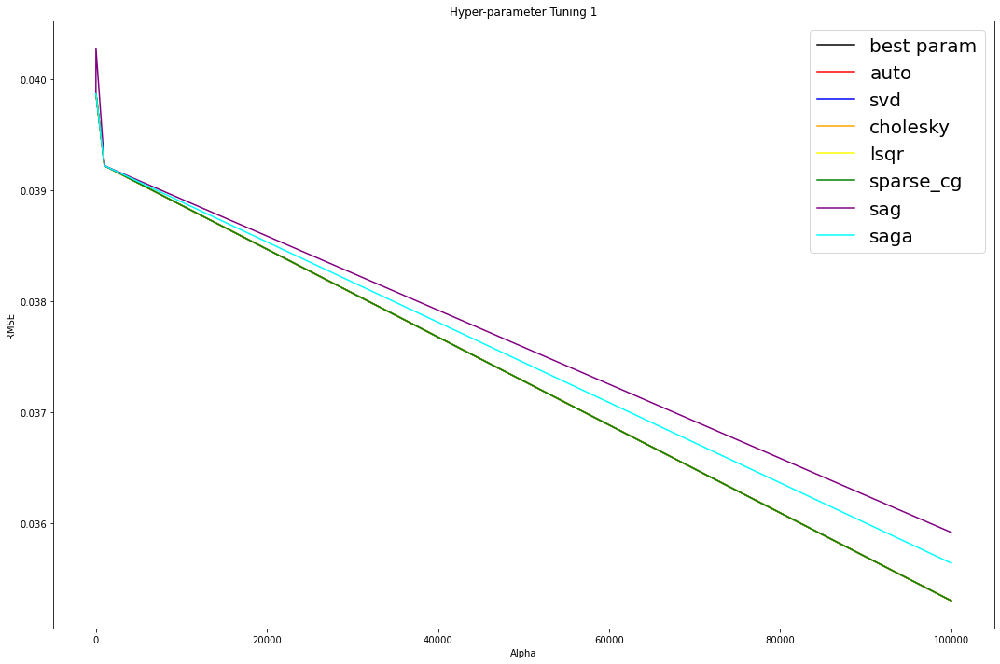

,alpha,random_state,solver,squared_error,RMSE
35,100000.00000,42,auto,0.124626,0.035302
36,100000.00000,42,cholesky,0.124626,0.035302
37,100000.00000,42,lsqr,0.124626,0.035302
40,100000.00000,42,sparse_cg,0.124626,0.035302
41,100000.00000,42,svd,0.124626,0.035302
39,100000.00000,42,saga,0.127027,0.035641
38,100000.00000,42,sag,0.129011,0.035918
28,1000.00000,42,auto,0.153824,0.039220
29,1000.00000,42,cholesky,0.153824,0.039220
30,1000.00000,42,lsqr,0.153824,0.039220


In [182]:
#visualising the results of grid 1 
gs=1
ridge_reg_1_cv_results = hp_tuning_results_clean_rr(Ridge_reg)
ridge_reg_1_cv_results

## Part 5.2: Ridge Regression Grid Search 2

In [183]:
#grid search 2 for ridge regression
#setting up parameter grid 
parameters = {'alpha':[1000, 2500, 5000, 7500, 10000, 25000, 50000, 75000, 100000, 250000, 500000],     
             'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga'],
             'random_state':[42]} 

# define the model/ estimator
model = Ridge()

#initializing the cross validation method 
logo = LeaveOneGroupOut()

#retrieving the groups for logo
gps = list(train["Task ID"].astype(str)) 

# define the grid search
Ridge_reg= GridSearchCV(model, parameters, #specifying the x and y data frames
                         scoring = error_func_v2, #leveraging our own scoring method                       
                         cv = logo, #setting the cv to be LeaveOneGroup out 
                         n_jobs = -1, #utilizing all of the cpus 
                        verbose = 1)

#fit the grid search
Ridge_reg.fit(X_train, y_train, groups = gps)

#finding best parameter 
print("Best parameters found:", Ridge_reg.best_params_)
print("Mean CV score of best parameters:", Ridge_reg.best_score_)

Fitting 100 folds for each of 77 candidates, totalling 7700 fits
Best parameters found: {'alpha': 250000, 'random_state': 42, 'solver': 'lsqr'}
Mean CV score of best parameters: -0.029347819040000007


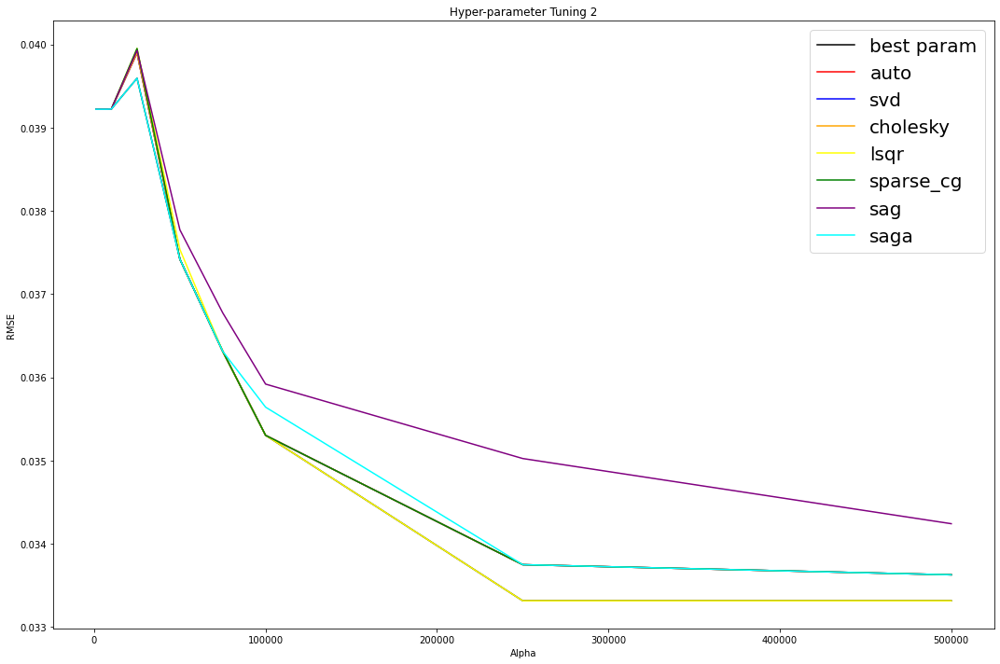

,alpha,random_state,solver,squared_error,RMSE
65,250000,42,lsqr,0.110988,0.033315
72,500000,42,lsqr,0.110988,0.033315
70,500000,42,auto,0.113075,0.033627
71,500000,42,cholesky,0.113075,0.033627
74,500000,42,saga,0.113075,0.033627
...,...,...,...,...,...
36,25000,42,cholesky,0.159183,0.039898
41,25000,42,svd,0.159183,0.039898
38,25000,42,sag,0.159419,0.039927
37,25000,42,lsqr,0.159601,0.039950


In [184]:
#gs2
gs=2
ridge_reg_2_cv_results = hp_tuning_results_clean_rr(Ridge_reg)
ridge_reg_2_cv_results

## Part 5.3: Validation of Tuned Ridge Regression

In [199]:
#refitting using selected hyperparameters
ridge_reg_tuned = Ridge(alpha= 250000, solver='lsqr',random_state = seed)
ridge_reg_tuned.fit(X_train, y_train)

Ridge(alpha=250000, random_state=42, solver='lsqr')

In [200]:
#checking on the parameters
ridge_reg_tuned.get_params()

{'alpha': 250000,
 'copy_X': True,
 'fit_intercept': True,
 'max_iter': None,
 'normalize': 'deprecated',
 'positive': False,
 'random_state': 42,
 'solver': 'lsqr',
 'tol': 0.001}

In [201]:
#checking the intercept terms 
ridge_reg_tuned.intercept_

0.41476414967777725

In [202]:
#checking the intercept terms 
ridge_reg_tuned.intercept_

0.41476414967777725

In [203]:
#checking the score on train set 
ridge_reg_tuned.score(X_train, y_train)

0.03260959512346373

In [204]:
#checking the score on test set 
ridge_reg_tuned.score(X_test, y_test)

0.026176917366711128

In [205]:
#saving the results 
ridge_reg_tuned_results = validate_model(ridge_reg_tuned, train, test, X_train, X_test)
ridge_reg_tuned_results.to_csv("./ridge_reg_tuned_results.csv", index = False)

Validation on Train Set
The final rmse 0.03202989843727772

Task IDs
['2019 05 30', '2019 09 26', '2019 11 29', '2020 01 08', '2020 01 09', '2020 01 10', '2020 01 14', '2020 01 15', '2020 01 16', '2020 01 22', '2020 02 18', '2020 02 20', '2020 03 01', '2020 03 03', '2020 03 28', '2020 05 06', '2020 06 09', '2020 07 22', '2020 08 04', '2020 09 01', '2020 10 23', '2021 03 18', '2021 03 23', '2021 03 25', '2021 03 29', '2021 04 08', '2021 04 12', '2021 04 20', '2021 04 22', '2021 04 28', '2021 05 05', '2021 05 06', '2021 05 13', '2021 05 20', '2021 05 24', '2021 05 31', '2021 06 01', '2021 06 08', '2021 06 14', '2021 06 17', '2021 06 21', '2021 06 24', '2021 06 30', '2021 07 15', '2021 07 19', '2021 07 22', '2021 08 30', '2021 09 09', '2021 09 14', '2021 09 17', '2021 09 20', '2021 09 21', '2021 09 23', '2021 09 24', '2021 09 27', '2021 09 28', '2021 09 30', '2021 10 01', '2021 10 02', '2021 10 04', '2021 10 05', '2021 10 07', '2021 10 11', '2021 10 13', '2021 10 14', '2021 10 18', '2021 

# Part 6: Altenrative Model

## Part 6.1: Benchmarking Alternative Models

In [ ]:
#Retrieve task id in the train set 
tasks_id = train['Task ID']

#evaluate each model in turn
names = []

models=[]
models.append(('LSO',Lasso()))
models.append(('MLR',LinearRegression()))
models.append(('DCT',DecisionTreeRegressor(random_state=101)))
models.append(('RFR',RandomForestRegressor(random_state=101)))
models.append(('GBR',GradientBoostingRegressor(random_state=101)))

for name, model in models :
    start = time.time()
    errors = cross_val_score(model, 
                                 X_train, y_train, 
                                 groups = tasks_id, #specifying for group
                                 scoring = error_func_v2, #leveraging our own scoring method                       
                                 cv = logo, #setting the cv to be LeaveOneGroup out 
                                 n_jobs = -1) #utilizing all of the cpus
    
    #visualizing the errors
    print("\n"+name+":")
    print(f"There are {len(errors)} errors in total")
    print(f"the average errors are {np.mean(errors)} ")
    print(f"the standard deviation of errors {np.std(errors)}")

    #compuring the rmse 
    rmse = ((errors**2).sum()/len(errors))**0.5
    print(f"The RMSE is {rmse}")
    end = time.time()
    print(f"the computational time is {end-start} ")


LSO:
There are 100 errors in total
the average errors are -0.06816435984 
the standard deviation of errors 0.03835824843561334
The RMSE is 0.07821595218013547
the computational time is 0.9033386707305908 

MLR:
There are 100 errors in total
the average errors are -0.03606257629000001 
the standard deviation of errors 0.016999140623758725
The RMSE is 0.03986828552393988
the computational time is 1.3446431159973145 

DCT:
There are 100 errors in total
the average errors are -0.030066325910000007 
the standard deviation of errors 0.01864228903977597
The RMSE is 0.035376812948157
the computational time is 6.841450452804565 

RFR:
There are 100 errors in total
the average errors are -0.023190779940000003 
the standard deviation of errors 0.017790133512387857
The RMSE is 0.029228430074400027
the computational time is 426.2642869949341 

GBR:
There are 100 errors in total
the average errors are -0.020989604040000002 
the standard deviation of errors 0.014787867976713451
The RMSE is 0.0256757

## Part 6.2: Base Gradient Boosting Regressor Model

In [ ]:
gbr_base = GradientBoostingRegressor(random_state=seed)
gbr_base.fit(X_train, y_train)

In [240]:
gbr_base.get_params()

{'alpha': 0.9,
 'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'squared_error',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': 42,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [241]:
gbr_base.score(X_train,y_train)

0.8665144434076752

In [242]:
gbr_base.score(X_test,y_test)

0.4825652639897601

In [ ]:
#saving the result
gbr_base_results = validate_model(gbr_base, train, test, X_train, X_test)
gbr_base_results.to_csv("./gbr_base_results.csv", index = False)

## Part 6.3: Gradient Boosting Regression Grid Search 1

In [1]:
def hp_tuning_results_clean_alternative(gs_cv):
    #creating an empty dataframe 
    gs_result_df_raw = pd.DataFrame()

    #retrieving the results from grid search
    n_split = gs_cv.n_splits_
    #retrieving the 
    param_combo = list(gs_cv.cv_results_["params"][0].keys())

    #extracting information from the gs_cv.cv_results_

    #for each split from the leave one out 
    for split in range(n_split):
        #for each of the parameters combinations 
        for i, param in enumerate(gs_cv.cv_results_["params"]):
            cur_entry = dict()
            #saving each of the individual parmaeter values in
            for param_name in param_combo:
                cur_entry[param_name] = param[param_name]
            #saving the current split 
            cur_entry["split"] = split
            #accessing the information (error) on the current split and the current param combo 
            cur_entry["error"] = gs_cv.cv_results_[f'split{split}_test_score'][i]
            cur_entry["squared_error"] = cur_entry["error"]**2
            #saving it as a new entry of the dataframe 
            gs_result_df_raw = gs_result_df_raw.append(pd.DataFrame(cur_entry, index = [0]), ignore_index = True)

    #groupby the parameters and compute RMSE using the n squared errors 
    gs_result_df = pd.DataFrame(gs_result_df_raw.groupby(param_combo, as_index = False)["squared_error"].sum())
    gs_result_df["RMSE"] = (gs_result_df["squared_error"]/gs_cv.n_splits_)**0.5
    #gs_result_df["std"]=gs_result_df["squared_error"] #square root it to get the standard deviation!
    gs_result_df["std"]=((gs_result_df["RMSE"]-gs_result_df["RMSE"].mean())**2/len(gs_result_df["RMSE"]))**0.5
    gs_result_df_sort = gs_result_df.sort_values(by = ["RMSE"], ascending = True)
    return(gs_result_df_sort)

In [105]:
#setting up parameter grid 
parameters = {
        'n_estimators': [50, 100, 250, 500],
        'learning_rate': [0.01, 0.05, 0.10,0.5],
        'max_depth': [2,4,8,16],
        'loss': ['squared_error', 'absolute_error', 'huber'],
        'random_state': [42]
        }


# define the model/ estimator
model = GradientBoostingRegressor(random_state=42)

#initializing the cross validation method 
logo = LeaveOneGroupOut()

#retrieving the groups for logo
gps = list(train["Task ID"].astype(str))

#start
start = time.time()
# define the grid search
gbr_gs_1 = GridSearchCV(model, parameters, #specifying the x and y data frames
                         scoring = error_func_v2, #leveraging our own scoring method                       
                         cv = logo, #setting the cv to be LeaveOneGroup out 
                         n_jobs = -1, #utilizing all of the cpus 
                        verbose = 3)

#fit the grid search
gbr_gs_1.fit(X_train, y_train, groups = gps)

#retrieve the result
gbr_gs_1_cv_results = hp_tuning_results_clean_alternative(gbr_gs_1)

#end
end = time.time()
print(f"the computational time is {end-start} ")

Fitting 100 folds for each of 192 candidates, totalling 19200 fits
the computational time is 82379.74702048302 


In [106]:
gbr_gs_1_cv_results = hp_tuning_results_clean_alternative(gbr_gs_1)
gbr_gs_1_cv_results.to_csv("./gbr_gs_1.csv")
with open('gbr_gs1_saved_dictionary.pkl', 'wb') as f:
    pickle.dump(gbr_gs_1, f)
gbr_gs_1_cv_results.head(20)

,learning_rate,loss,max_depth,n_estimators,random_state,squared_error,RMSE,std
99,0.10,absolute_error,2,500,42,0.048035,0.021917,0.000618
55,0.05,absolute_error,4,500,42,0.049167,0.022174,0.000599
39,0.01,squared_error,4,500,42,0.050122,0.022388,0.000584
54,0.05,absolute_error,4,250,42,0.052041,0.022813,0.000553
70,0.05,huber,4,250,42,0.052570,0.022928,0.000545
116,0.10,huber,4,50,42,0.053259,0.023078,0.000534
179,0.50,squared_error,2,500,42,0.053274,0.023081,0.000534
71,0.05,huber,4,500,42,0.053611,0.023154,0.000528
101,0.10,absolute_error,4,100,42,0.054240,0.023289,0.000519
102,0.10,absolute_error,4,250,42,0.054448,0.023334,0.000515


## Part 6.4: Gradient Boosting Regression Grid Search 2

In [115]:
#setting up parameter grid 
parameters = {
        'n_estimators': [250, 375, 500, 625],
        'learning_rate': [0.025, 0.05, 0.075, 0.10, 0.125],
        'max_depth': [2,4,6,8],
        'loss': ['squared_error', 'absolute_error', 'huber'],
        'random_state': [42]
        }


# define the model/ estimator
model = GradientBoostingRegressor(random_state=42)

#initializing the cross validation method 
logo = LeaveOneGroupOut()

#retrieving the groups for logo
gps = list(train["Task ID"].astype(str))

#start
start = time.time()
# define the grid search
gbr_gs_2 = GridSearchCV(model, parameters, #specifying the x and y data frames
                         scoring = error_func_v2, #leveraging our own scoring method                       
                         cv = logo, #setting the cv to be LeaveOneGroup out 
                         n_jobs = -1, #utilizing all of the cpus 
                        verbose = 3)

#fit the grid search
gbr_gs_2.fit(X_train, y_train, groups = gps)

#retrieve the result
#gbr_gs_2_cv_results = hp_tuning_results_clean_alternative(gbr_gs_1)

#end
end = time.time()
print(f"the computational time is {end-start} ")

Fitting 100 folds for each of 240 candidates, totalling 24000 fits
[CV 2/100] END learning_rate=0.025, loss=squared_error, max_depth=2, n_estimators=250, random_state=42;, score=-0.027 total time=   2.5s
[CV 16/100] END learning_rate=0.025, loss=squared_error, max_depth=2, n_estimators=250, random_state=42;, score=-0.028 total time=   2.5s
[CV 22/100] END learning_rate=0.025, loss=squared_error, max_depth=2, n_estimators=250, random_state=42;, score=0.000 total time=   2.6s
[CV 28/100] END learning_rate=0.025, loss=squared_error, max_depth=2, n_estimators=250, random_state=42;, score=-0.064 total time=   2.5s
[CV 35/100] END learning_rate=0.025, loss=squared_error, max_depth=2, n_estimators=250, random_state=42;, score=-0.017 total time=   2.6s
[CV 42/100] END learning_rate=0.025, loss=squared_error, max_depth=2, n_estimators=250, random_state=42;, score=-0.025 total time=   2.5s
[CV 52/100] END learning_rate=0.025, loss=squared_error, max_depth=2, n_estimators=250, random_state=42;, s

In [116]:
gbr_gs_2_cv_results = hp_tuning_results_clean_alternative(gbr_gs_2)
gbr_gs_2_cv_results.to_csv("./gbr_gs_2.csv")
with open('gbr_gs1_saved_dictionary.pkl', 'wb') as f:
    pickle.dump(gbr_gs_2, f)
gbr_gs_2_cv_results.head(20)

,learning_rate,loss,max_depth,n_estimators,random_state,squared_error,RMSE,std
147,0.100,absolute_error,2,625,42,0.047754,0.021853,0.000243
146,0.100,absolute_error,2,500,42,0.048035,0.021917,0.000239
194,0.125,absolute_error,2,500,42,0.048263,0.021969,0.000235
25,0.025,huber,6,375,42,0.048893,0.022112,0.000226
23,0.025,huber,4,625,42,0.048980,0.022131,0.000225
195,0.125,absolute_error,2,625,42,0.049066,0.022151,0.000224
54,0.050,absolute_error,4,500,42,0.049167,0.022174,0.000222
22,0.025,huber,4,500,42,0.049307,0.022205,0.000220
26,0.025,huber,6,500,42,0.050217,0.022409,0.000207
20,0.025,huber,4,250,42,0.050405,0.022451,0.000204


## Part 6.5: Validation of Tuned Gradient Boosting Regressor

In [ ]:
#refitting using selected hyperparameters
gbr_tuned = GradientBoostingRegressor(n_estimators=625, learning_rate=0.1, max_depth=2,loss='absolute_error',
                                            random_state=seed)
gbr_tuned.fit(X_train, y_train)

In [ ]:
#saving the result
gbr_tuned_results = validate_model(gbr_tuned, train, test, X_train, X_test)
gbr_tuned_results.to_csv("./gbr_tuned_results.csv", index = False)